In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/forecastingtcn/val_transformed_10.csv
/kaggle/input/forecastingtcn/train_transformed_10.csv
/kaggle/input/forecastingtcn/test_transformed_10.csv


In [1]:
!pip install darts


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.2/52.2 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.8/165.8 kB 10.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 917.3/917.3 kB 37.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 55.2 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 314.7/314.7 kB 17.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.7/196.7 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.2/278.2 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.3/135.3 kB 5.7 MB/s eta 0:00:00

In [6]:
import pandas as pd

# File paths
train_file_path = '/kaggle/input/forecastingtcn/train_transformed_10.csv'
val_file_path = '/kaggle/input/forecastingtcn/val_transformed_10.csv'
test_file_path = '/kaggle/input/forecastingtcn/test_transformed_10.csv'

# Read the CSV files
train_df = pd.read_csv(train_file_path)
val_df = pd.read_csv(val_file_path)
test_df= pd.read_csv(test_file_path)


In [9]:
import pandas as pd
import matplotlib.pyplot as plt
from darts import TimeSeries
from darts.models import TCNModel

# Select only the relevant numeric features for training
features = ['Month', 'VolSWC_20cm', 'Hour', 
            'SoilTemp_10cm', 'VolSWC_10cm', 'SoilTemp_40cm', 
            'NET_Radiation', 'SoilTemp_20cm', 'SoilHeatFlux_DiffVolt1']

# Create TimeSeries from the selected features for training and validation sets
train_transformed = TimeSeries.from_dataframe(train_df[features], freq='10T')
val_transformed = TimeSeries.from_dataframe(val_df[features], freq='10T')

# Initialize the model
model = TCNModel(
    input_chunk_length=30,
    output_chunk_length=7,
    n_epochs=10,
    dropout=0.1,
    dilation_base=2,
    weight_norm=False,
    kernel_size=3,
    num_filters=8,
    random_state=0
)
# Fit the model
model.fit(
    series=train_transformed,
    val_series=val_transformed,
    verbose=True
)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

TCNModel(output_chunk_shift=0, kernel_size=3, num_filters=8, num_layers=None, dilation_base=2, weight_norm=False, dropout=0.1, input_chunk_length=30, output_chunk_length=7, n_epochs=10, random_state=0)

In [24]:
!pip install keras-tcn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 23.3 MB/s eta 0:00:00
  Attempting uninstall: typeguard
    Found existing installation: typeguard 4.3.0
    Uninstalling typeguard-4.3.0:
      Successfully uninstalled typeguard-4.3.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ydata-profiling 4.9.0 requires scipy<1.14,>=1.4.1, but you have scipy 1.14.0 which is incompatible.
ydata-profiling 4.9.0 requires typeguard<5,>=3, but you have typeguard 2.13.3 which is incompatible.


In [27]:
!pip install keras-tcn --upgrad

Epoch 1/10
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 2.9148 - val_loss: 2.9266
Epoch 2/10
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.9195 - val_loss: 2.9470
Epoch 3/10
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.9103 - val_loss: 2.9424
Epoch 4/10
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.9254 - val_loss: 2.9512
Epoch 5/10
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.8874 - val_loss: 2.8794
Epoch 6/10
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.8850 - val_loss: 2.9134
Epoch 7/10
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 2.8583 - val_loss: 2.9341
Epoch 8/10
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 2.9147 - val_loss: 2.8538
Epoch 9/10
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.8502 - val_loss: 2.8929
Epoch 10/10
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 2.8860 - val_loss: 2.9188


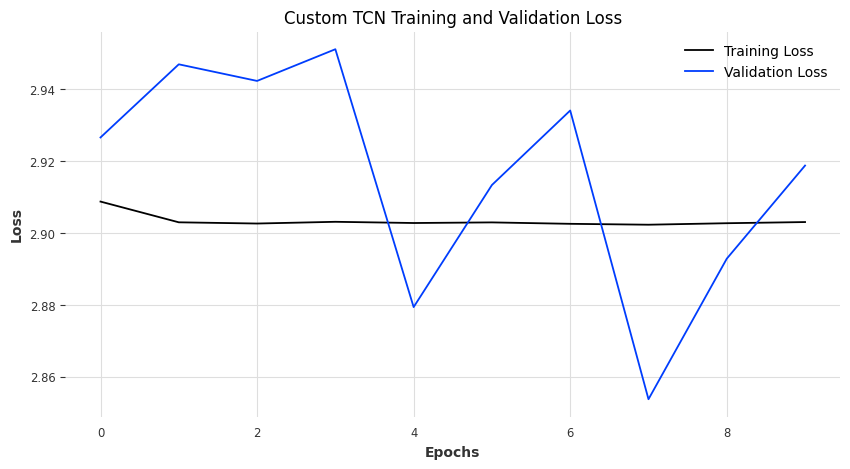

225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ValueError: x and y can be no greater than 2D, but have shapes (7192,) and (7192, 10, 1)

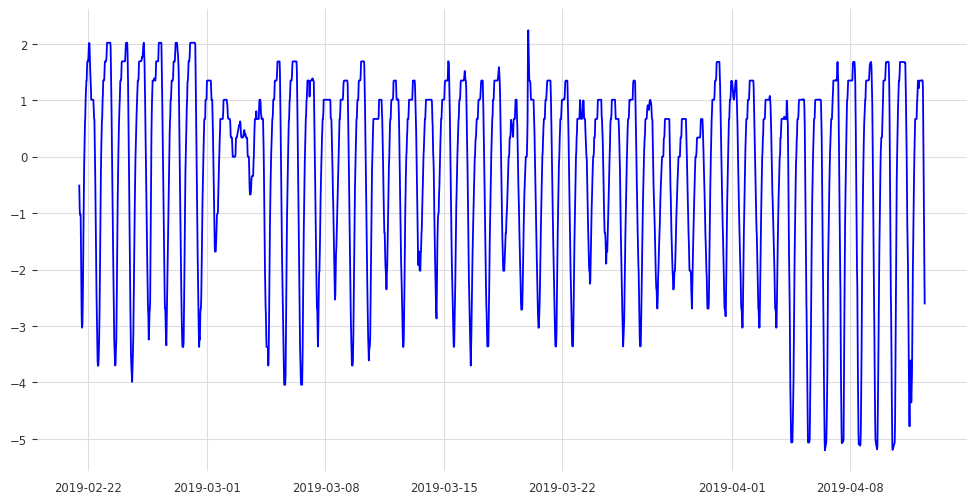

In [31]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input, Conv1D, Dropout
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Function to load data
def load_data(train_file, val_file):
    train_df = pd.read_csv(train_file)
    val_df = pd.read_csv(val_file)
    
    # Convert 'DateTime' column to datetime and set as index
    for df in [train_df, val_df]:
        df['DateTime'] = pd.to_datetime(df['DateTime'])
        df.set_index('DateTime', inplace=True)
    
    return train_df, val_df

# Load your CSV data files (adjust paths as needed)
train_file = '/kaggle/input/forecastingtcn/train_transformed_10.csv'
val_file = '/kaggle/input/forecastingtcn/val_transformed_10.csv'
train_df, val_df = load_data(train_file, val_file)

# Select relevant features and target
features = ['Month', 'VolSWC_20cm', 'Hour', 'SoilTemp_10cm', 'VolSWC_10cm',
            'SoilTemp_40cm', 'NET_Radiation', 'SoilTemp_20cm']
target = 'SoilHeatFlux_DiffVolt1'

X_train = train_df[features].values
y_train = train_df[target].values
X_val = val_df[features].values
y_val = val_df[target].values

# Normalize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)

# Reshape the data for the TCN model
timesteps = 10

def create_sequences(X, y, timesteps):
    X_seq, y_seq = [], []
    for i in range(len(X) - timesteps):
        X_seq.append(X[i:i + timesteps])
        y_seq.append(y[i + timesteps])
    return np.array(X_seq), np.array(y_seq)

X_train_seq, y_train_seq = create_sequences(X_train, y_train, timesteps)
X_val_seq, y_val_seq = create_sequences(X_val, y_val, timesteps)

# Build a custom TCN model
def create_tcn_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    
    # First convolution layer
    model.add(Conv1D(filters=64, kernel_size=3, padding='causal', activation='relu'))
    model.add(Dropout(0.2))
    
    # Second convolution layer with dilation
    model.add(Conv1D(filters=64, kernel_size=3, dilation_rate=2, padding='causal', activation='relu'))
    model.add(Dropout(0.2))
    
    # Output layer
    model.add(Dense(1, activation='linear'))
    
    return model

# Create and compile the model
input_shape = (timesteps, X_train_seq.shape[2])
model = create_tcn_model(input_shape)
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(X_train_seq, y_train_seq, validation_data=(X_val_seq, y_val_seq), epochs=10, batch_size=32, verbose=1)

# Plot training history
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Custom TCN Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Predict soil heat flux on validation set
predictions = model.predict(X_val_seq)

# Plot actual vs predicted
plt.figure(figsize=(12, 6))
plt.plot(val_df.index[timesteps:], y_val_seq, label='Actual', color='blue')
plt.plot(val_df.index[timesteps:], predictions, label='Predicted', color='red', linestyle='--')
plt.title('Actual vs Predicted Soil Heat Flux (Custom TCN)')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


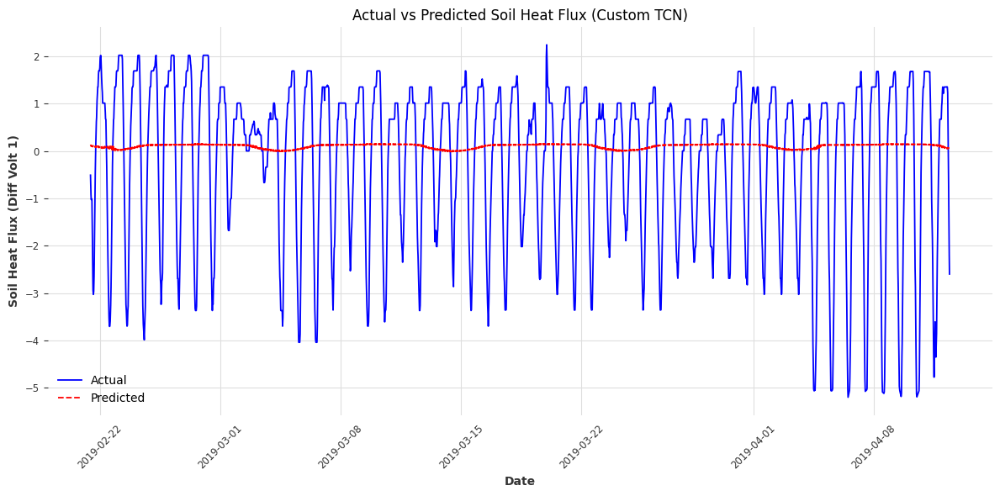

In [39]:
# Predict soil heat flux on validation set
predictions = model.predict(X_val_seq)

# Reshape predictions to 1D
predictions = predictions.flatten()  # Change predictions to 1D

# Ensure we are only using valid indices for y_val_seq
valid_index = val_df.index[timesteps:]

# Plot actual vs predicted
plt.figure(figsize=(12, 6))
plt.plot(valid_index, y_val_seq, label='Actual', color='blue')
plt.plot(valid_index, predictions[:len(valid_index)], label='Predicted', color='red', linestyle='--')
plt.title('Actual vs Predicted Soil Heat Flux (Custom TCN)')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [2]:
!pip install darts


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.2/52.2 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.8/165.8 kB 6.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 917.3/917.3 kB 28.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 51.6 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 314.7/314.7 kB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.7/196.7 kB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.2/278.2 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.3/135.3 kB 8.1 MB/s eta 0:00:00

In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from darts import TimeSeries
from darts.models import TCNModel

# Function to load data
def load_data(train_file, val_file):
    train_df = pd.read_csv(train_file)
    val_df = pd.read_csv(val_file)
    
    # Convert 'DateTime' column to datetime and set as index
    for df in [train_df, val_df]:
        df['DateTime'] = pd.to_datetime(df['DateTime'])
        df.set_index('DateTime', inplace=True)
    
    return train_df, val_df

# Load your CSV data files (adjust paths as needed)
train_file = '/kaggle/input/forecastingtcn/train_transformed_10.csv'  # Update this path
val_file = '/kaggle/input/forecastingtcn/val_transformed_10.csv'   
train_df, val_df = load_data(train_file, val_file)

# Select relevant features and target
features = ['Month', 'VolSWC_20cm', 'Hour', 'SoilTemp_10cm', 'VolSWC_10cm',
            'SoilTemp_40cm', 'NET_Radiation', 'SoilTemp_20cm']
target = 'SoilHeatFlux_DiffVolt1'

# Prepare TimeSeries objects
train_series = TimeSeries.from_dataframe(train_df[features + [target]], freq='10T')
val_series = TimeSeries.from_dataframe(val_df[features + [target]], freq='10T')

# Initialize the TCN model
model = TCNModel(
    input_chunk_length=30,   # Length of input sequences
    output_chunk_length=1,   # Predicting one step ahead
    n_epochs=10,             # Set to 10 epochs as requested
    dropout=0.1,
    dilation_base=2,
    weight_norm=False,
    kernel_size=3,
    num_filters=8,
    random_state=0
)

# Fit the model on training data with validation data
history=model.fit(series=train_series[target], val_series=val_series[target], verbose=True)


/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Actual Values Shape: (7202, 1)
Predictions Shape: (7202, 1)


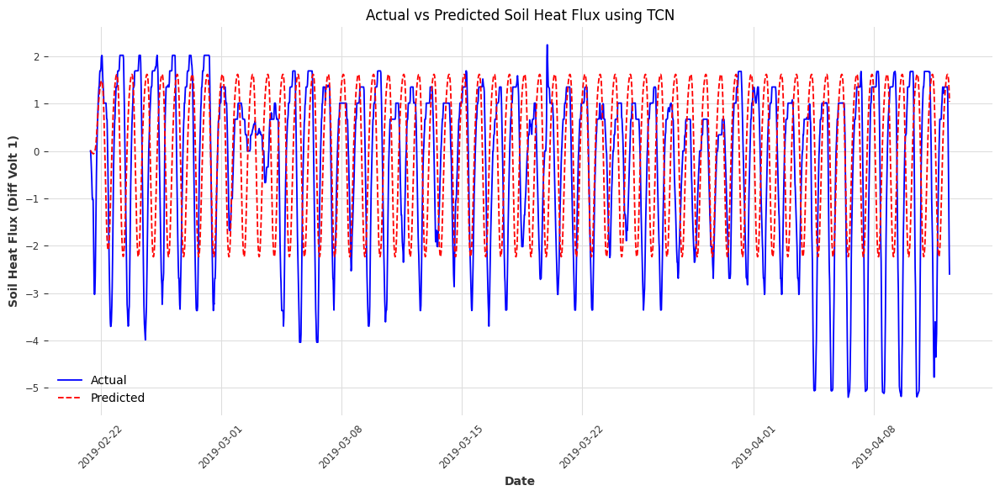

In [46]:
# Predict soil heat flux on validation set
predictions = model.predict(n=len(val_series))

# Extract actual values for comparison
actual_values = val_series[target]

# Ensure actual and predicted values are one-dimensional arrays
print("Actual Values Shape:", actual_values.values().shape)
print("Predictions Shape:", predictions.values().shape)

# Plot actual vs predicted values
plt.figure(figsize=(12, 6))
plt.plot(actual_values.time_index, actual_values.values(), label='Actual', color='blue')
plt.plot(predictions.time_index, predictions.values(), label='Predicted', color='red', linestyle='--')
plt.title('Actual vs Predicted Soil Heat Flux using TCN')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [47]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
actual_values_np = actual_values.values().flatten()  # Convert actual values to 1D array
predictions_np = predictions.values().flatten()      # Convert predictions to 1D array

# Print shapes
print("Actual Values Shape:", actual_values_np.shape)
print("Predictions Shape:", predictions_np.shape)

# Calculate metrics
mse = mean_squared_error(actual_values_np, predictions_np)
mae = mean_absolute_error(actual_values_np, predictions_np)
r2 = r2_score(actual_values_np, predictions_np)

# Print the metrics
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"R-squared (R²): {r2:.4f}")

Actual Values Shape: (7202,)
Predictions Shape: (7202,)
Mean Squared Error (MSE): 4.9910
Mean Absolute Error (MAE): 1.7655
R-squared (R²): -0.7017


In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator
from darts import TimeSeries

# Load the transformed training data
train_file = '/kaggle/input/forecastingtcn/train_transformed_10.csv'  # Adjust the path if necessary
train_df = pd.read_csv(train_file)

# Check the range of the target variable
target = 'SoilHeatFlux_DiffVolt1'
min_value = train_df[target].min()
max_value = train_df[target].max()
print(f"Target Variable Range: Min = {min_value}, Max = {max_value}")

Target Variable Range: Min = -5.21, Max = 4.732666666666667


In [49]:
# Prepare TimeSeries object for the entire dataset
train_series = TimeSeries.from_dataframe(train_df[features + [target]], freq='10T')

In [25]:
min_value = train_series[target].min()
max_value = train_series[target].max()
print(f"Target Variable Range: Min = {min_value}, Max = {max_value}")

Target Variable Range: Min = <TimeSeries (DataArray) (time: 33611, component: 1, sample: 1)> Size: 269kB
array([[[1.4675    ]],

       [[1.53833333]],

       [[1.60916667]],

       ...,

       [[0.00377778]],

       [[0.        ]],

       [[0.        ]]])
Coordinates:
  * time       (time) int64 269kB 0 1 2 3 4 5 ... 33606 33607 33608 33609 33610
  * component  (component) object 8B 'SoilHeatFlux_DiffVolt1'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None
    hierarchy:          None, Max = <TimeSeries (DataArray) (time: 33611, component: 1, sample: 1)> Size: 269kB
array([[[1.4675    ]],

       [[1.53833333]],

       [[1.60916667]],

       ...,

       [[0.00377778]],

       [[0.        ]],

       [[0.        ]]])
Coordinates:
  * time       (time) int64 269kB 0 1 2 3 4 5 ... 33606 33607 33608 33609 33610
  * component  (component) object 8B 'SoilHeatFlux_DiffVolt1'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None

Predicting: |          | 0/? [00:00<?, ?it/s]

/tmp/ipykernel_36/1238322101.py:20: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  future_dates = pd.date_range(last_date, periods=n_future_steps + 1, freq='10T')[1:]  # Add 10 min steps


Predictions Range: -2.235221483814235 1.6172701677205799
Past time index: DatetimeIndex(['2019-01-22 09:20:00', '2019-01-22 09:30:00',
               '2019-01-22 09:40:00', '2019-01-22 09:50:00',
               '2019-01-22 10:00:00', '2019-01-22 10:10:00',
               '2019-01-22 10:20:00', '2019-01-22 10:30:00',
               '2019-01-22 10:40:00', '2019-01-22 10:50:00',
               ...
               '2019-02-21 07:40:00', '2019-02-21 07:50:00',
               '2019-02-21 08:00:00', '2019-02-21 08:10:00',
               '2019-02-21 08:20:00', '2019-02-21 08:30:00',
               '2019-02-21 08:40:00', '2019-02-21 08:50:00',
               '2019-02-21 09:00:00', '2019-02-21 09:10:00'],
              dtype='datetime64[ns]', name='DateTime', length=4320, freq=None)
Future time index: DatetimeIndex(['2019-02-21 09:20:00', '2019-02-21 09:30:00',
               '2019-02-21 09:40:00', '2019-02-21 09:50:00',
               '2019-02-21 10:00:00', '2019-02-21 10:10:00',
               

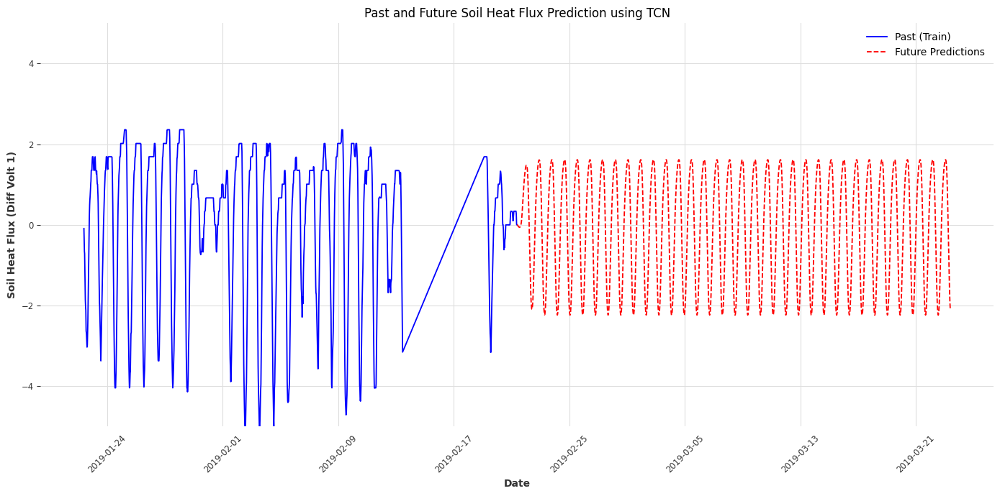

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Ensure the 'DateTime' column in train_df is a DateTimeIndex
if not isinstance(train_df.index, pd.DatetimeIndex):
    train_df['DateTime'] = pd.to_datetime(train_df['DateTime'])
    train_df.set_index('DateTime', inplace=True)

# Predict future values
n_future_steps = 144 * 30  # Number of future steps to predict
predictions = model.predict(n=n_future_steps, series=train_series[target])

# Extract the last few rows from the training set to show past values
n_past = 144 * 30  # Number of past timesteps displayed
train_last_df = train_df[-n_past:]  # Get last rows directly from train_df

# Generate future time index based on the last datetime in train_last_df
last_date = train_last_df.index[-1]
future_dates = pd.date_range(last_date, periods=n_future_steps + 1, freq='10T')[1:]  # Add 10 min steps

# Check predictions and their range
print("Predictions Range:", predictions.values().min(), predictions.values().max())
print("Past time index:", train_last_df.index)
print("Future time index:", future_dates)

# Plot past values (from training set) in blue and future predictions in red
plt.figure(figsize=(14, 7))  # Slightly larger figure size to avoid congestion

# Plot past values
plt.plot(train_last_df.index, train_last_df[target], color='blue', label='Past (Train)')  # Past values

# Plot future predictions
plt.plot(future_dates, predictions.values(), label='Future Predictions', color='red', linestyle='--')

plt.title('Past and Future Soil Heat Flux Prediction using TCN')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')

# Set legend location to the top right corner
plt.legend(loc='upper right')

# Format the x-axis to show the date and time
#plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))

# Adjusting the x-axis to use HourLocator for a better interval between ticks
plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=6))  # Tick every 6 hours
#Use MaxNLocator to limit the number of x-ticks
plt.gca().xaxis.set_major_locator(MaxNLocator(nbins=10, integer=True))
# Rotate and format x-ticks
plt.xticks(rotation=45)

# Set y-axis limits to expected range
plt.ylim(-5, 5)  # Use the confirmed range

plt.tight_layout()
plt.show()


In [51]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Assuming you have the true future values to compare against, you can slice them from train_df
# Get the last n_future_steps from train_df (assuming they correspond to your predictions)
true_future_values = train_df[target].iloc[-n_future_steps:]

# Calculate accuracy metrics
mae = mean_absolute_error(true_future_values, predictions.values())
mse = mean_squared_error(true_future_values, predictions.values())
r2 = r2_score(true_future_values, predictions.values())

# Print accuracy metrics
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"R-squared (R²): {r2:.4f}")


Mean Absolute Error (MAE): 1.8194
Mean Squared Error (MSE): 5.4373
R-squared (R²): -0.6188


In [43]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Assuming you have the true future values to compare against, you can slice them from train_df
# Get the last n_future_steps from train_df (assuming they correspond to your predictions)
true_future_values = train_df[target].iloc[-n_future_steps:]

# Calculate accuracy metrics
mae = mean_absolute_error(true_future_values, predictions.values())
mse = mean_squared_error(true_future_values, predictions.values())
r2 = r2_score(true_future_values, predictions.values())

# Print accuracy metrics
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"R-squared (R²): {r2:.4f}")


Mean Absolute Error (MAE): 1.8194
Mean Squared Error (MSE): 5.4373
R-squared (R²): -0.6188


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from darts import TimeSeries
from darts.models import TCNModel

# Function to load data
def load_data(train_file, val_file):
    train_df = pd.read_csv(train_file)
    val_df = pd.read_csv(val_file)
    
    # Convert 'DateTime' column to datetime and set as index
    for df in [train_df, val_df]:
        df['DateTime'] = pd.to_datetime(df['DateTime'])
        df.set_index('DateTime', inplace=True)
    
    return train_df, val_df

# Load your CSV data files (adjust paths as needed)
train_file = '/kaggle/input/forecastingtcn/train_transformed_10.csv'  # Update this path
val_file = '/kaggle/input/forecastingtcn/val_transformed_10.csv'   
train_df, val_df = load_data(train_file, val_file)

# Select relevant features and target
features = ['Month', 'VolSWC_20cm', 'Hour', 'SoilTemp_10cm', 'VolSWC_10cm',
            'SoilTemp_40cm', 'NET_Radiation', 'SoilTemp_20cm']
target = 'SoilHeatFlux_DiffVolt1'

# Prepare TimeSeries objects
train_series = TimeSeries.from_dataframe(train_df[features + [target]], freq='10T')
val_series = TimeSeries.from_dataframe(val_df[features + [target]], freq='10T')

# Initialize the TCN model
model = TCNModel(
    input_chunk_length=60,   # Increase input sequence length
    output_chunk_length=1,
    n_epochs=25,             # Increase epochs
    dropout=0.05,            # Adjust dropout rate
    dilation_base=3,         # Experiment with dilation
    weight_norm=True,        # Apply weight normalization
    kernel_size=5,           # Larger kernel size
    num_filters=16,          # Increase number of filters
    random_state=0
)


# Fit the model on training data with validation data
history=model.fit(series=train_series[target], val_series=val_series[target], verbose=True)


In [2]:
!pip install darts

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.2/52.2 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.8/165.8 kB 6.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 917.3/917.3 kB 24.6 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 64.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 314.7/314.7 kB 24.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.7/196.7 kB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.2/278.2 kB 21.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.3/135.3 kB 11.0 MB/s eta 0:00:00

Epoch 1/100


/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1051/1051 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.6463 - val_loss: 0.7284
Epoch 2/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0840 - val_loss: 0.4584
Epoch 3/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0638 - val_loss: 0.4349
Epoch 4/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0537 - val_loss: 0.4044
Epoch 5/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0471 - val_loss: 0.3211
Epoch 6/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0439 - val_loss: 0.3406
Epoch 7/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0406 - val_loss: 0.2422
Epoch 8/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0375 - val_loss: 0.3073
Epoch 9/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0353 - val_loss: 0.2536
Epoch 10/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0326 - val_loss: 0.3039
Epoch 11/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0338 - val_loss: 0.3408
Epoch 12/100
1051/1051 ━━━━━━━━

/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/torch/nn/utils/weight_norm.py:134: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

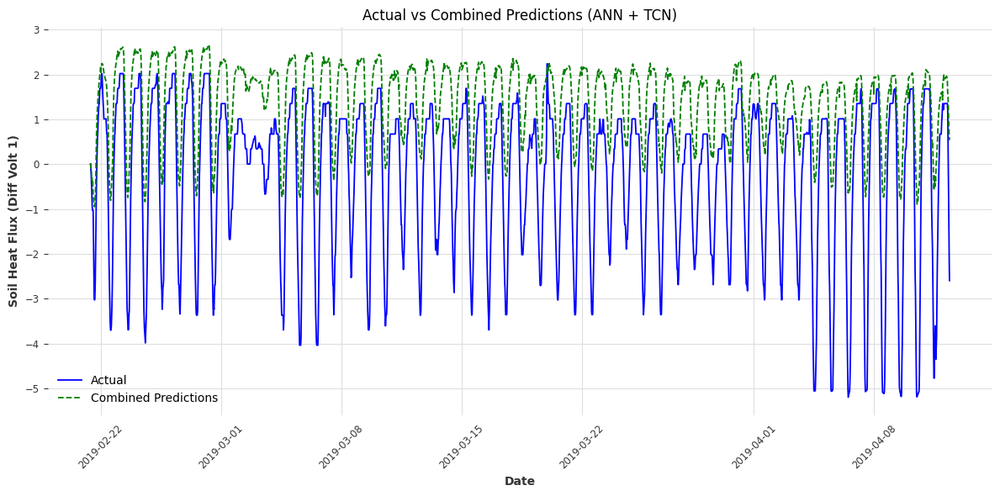

In [71]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import StandardScaler
from darts import TimeSeries
from darts.models import TCNModel

# Function to load data
def load_data(train_file, val_file):
    train_df = pd.read_csv(train_file)
    val_df = pd.read_csv(val_file)
    
    # Convert 'DateTime' column to datetime and set as index
    for df in [train_df, val_df]:
        df['DateTime'] = pd.to_datetime(df['DateTime'])
        df.set_index('DateTime', inplace=True)
    
    return train_df, val_df

# Load CSV data files (adjust paths as needed)
train_file = '/kaggle/input/forecastingtcn/train_transformed_10.csv'
val_file = '/kaggle/input/forecastingtcn/val_transformed_10.csv'
train_df, val_df = load_data(train_file, val_file)

# Select features and target
features = ['Month', 'VolSWC_20cm', 'Hour', 'SoilTemp_10cm', 'VolSWC_10cm',
            'SoilTemp_40cm', 'NET_Radiation', 'SoilTemp_20cm']
target = 'SoilHeatFlux_DiffVolt1'

X_train = train_df[features].values
y_train = train_df[target].values
X_val = val_df[features].values
y_val = val_df[target].values

# Normalize the data for ANN
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Build and train ANN model
ann_model = Sequential()
ann_model.add(Dense(64, activation='relu', input_dim=X_train_scaled.shape[1]))
ann_model.add(Dense(32, activation='relu'))
ann_model.add(Dense(1, activation='linear'))  # Output for regression
ann_model.compile(optimizer='adam', loss='mse')
ann_model.fit(X_train_scaled, y_train, validation_data=(X_val_scaled, y_val), epochs=100, batch_size=32, verbose=1)

# Get ANN predictions
ann_predictions = ann_model.predict(X_val_scaled)

# Prepare TimeSeries objects for TCN
train_series = TimeSeries.from_dataframe(train_df[features + [target]], freq='10T')
val_series = TimeSeries.from_dataframe(val_df[features + [target]], freq='10T')

# Initialize and train TCN model
tcn_model = TCNModel(
    input_chunk_length=60,
    output_chunk_length=1,
    n_epochs=25,
    dropout=0.05,
    dilation_base=3,
    weight_norm=True,
    kernel_size=5,
    num_filters=16,
    random_state=0
)
tcn_model.fit(series=train_series[target], val_series=val_series[target], verbose=True)

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(y_val), series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Combine predictions (Simple Averaging)
combined_predictions = (ann_predictions.flatten() + tcn_predictions_np.flatten()) / 2

# Plot actual vs combined predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, y_val, label='Actual', color='blue')
plt.plot(val_df.index, combined_predictions, label='Combined Predictions', color='green', linestyle='--')
plt.title('Actual vs Combined Predictions (ANN + TCN)')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Predicting: |          | 0/? [00:00<?, ?it/s]

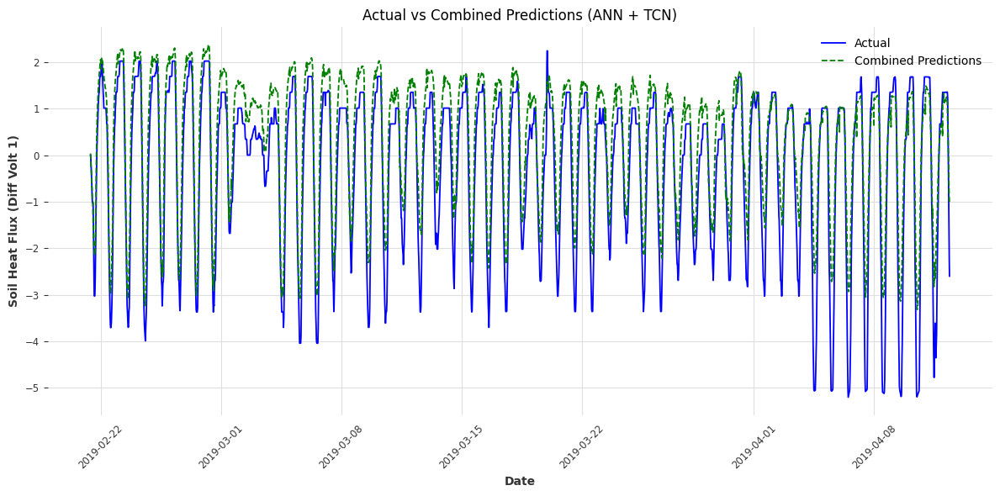

In [75]:
# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(y_val), series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Combine predictions 
combined_predictions = (0.8 * ann_predictions.flatten()) + (0.2 * tcn_predictions_np.flatten())


# Plot actual vs combined predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, y_val, label='Actual', color='blue')
plt.plot(val_df.index, combined_predictions, label='Combined Predictions', color='green', linestyle='--')
plt.title('Actual vs Combined Predictions (ANN + TCN)')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [76]:
print(combined_predictions.min())
print(combined_predictions.max())

-3.3176525154549457
2.369055577227959


In [77]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_val, combined_predictions)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_val, combined_predictions)

# Calculate R-squared (R²)
r2 = r2_score(y_val, combined_predictions)

# Print the evaluation metrics
print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R²): {r2}")


Mean Squared Error (MSE): 0.6058278023541409
Mean Absolute Error (MAE): 0.6271010065407645
R-squared (R²): 0.7934348766665088


Predicting: |          | 0/? [00:00<?, ?it/s]

135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Combined Predictions Range: -3.295296196025978 4.634962219195834
Past time index: DatetimeIndex(['2019-01-22 09:20:00', '2019-01-22 09:30:00',
               '2019-01-22 09:40:00', '2019-01-22 09:50:00',
               '2019-01-22 10:00:00', '2019-01-22 10:10:00',
               '2019-01-22 10:20:00', '2019-01-22 10:30:00',
               '2019-01-22 10:40:00', '2019-01-22 10:50:00',
               ...
               '2019-02-21 07:40:00', '2019-02-21 07:50:00',
               '2019-02-21 08:00:00', '2019-02-21 08:10:00',
               '2019-02-21 08:20:00', '2019-02-21 08:30:00',
               '2019-02-21 08:40:00', '2019-02-21 08:50:00',
               '2019-02-21 09:00:00', '2019-02-21 09:10:00'],
              dtype='datetime64[ns]', name='DateTime', length=4320, freq=None)
Future time index: DatetimeIndex(['2019-02-21 09:20:00', '2019-02-21 09:30:00',
               '2019-02-21 09:40:00', '2019-02-21 09:50:00',
               '2019-02-21 

/tmp/ipykernel_36/2549432580.py:46: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  future_dates = pd.date_range(last_date, periods=n_future_steps + 1, freq='10T')[1:]  # Add 10-min steps


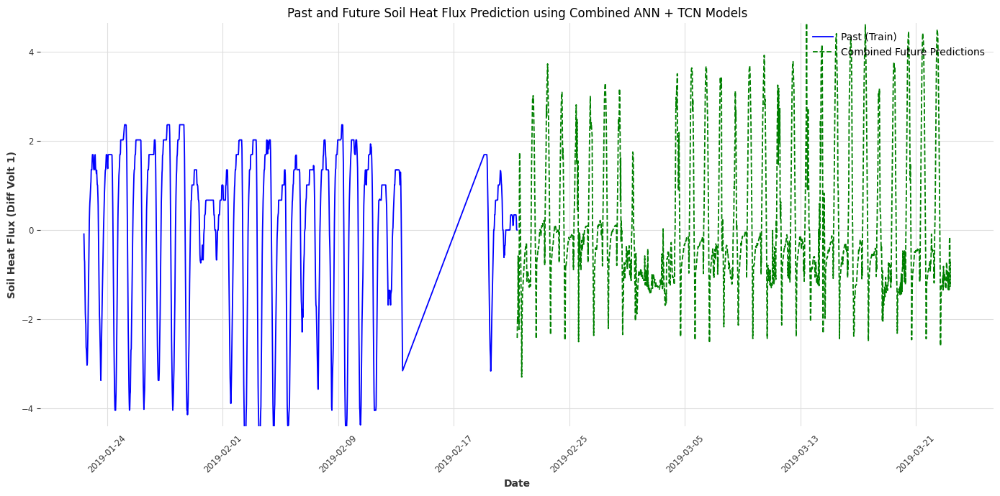

In [78]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Ensure the 'DateTime' column in train_df is a DateTimeIndex
if not isinstance(train_df.index, pd.DatetimeIndex):
    train_df['DateTime'] = pd.to_datetime(train_df['DateTime'])
    train_df.set_index('DateTime', inplace=True)

# Predict future values using both TCN and ANN models
n_future_steps = 144 * 30  # Number of future steps to predict

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Get ANN predictions
ann_predictions = ann_model.predict(X_val[:n_future_steps])  # Ensure that ann_predictions shape matches tcn_predictions

# Rescale predictions (optional, if scaling mismatch is suspected)
tcn_min, tcn_max = tcn_predictions_np.min(), tcn_predictions_np.max()
ann_min, ann_max = ann_predictions.min(), ann_predictions.max()

# Normalize both predictions to [0, 1] range
tcn_predictions_rescaled = (tcn_predictions_np - tcn_min) / (tcn_max - tcn_min)
ann_predictions_rescaled = (ann_predictions - ann_min) / (ann_max - ann_min)

# Combine predictions (weighted)
combined_predictions = (0.8 * ann_predictions_rescaled.flatten()) + (0.2 * tcn_predictions_rescaled.flatten())

# Scale combined predictions back to original range
combined_min = -4.405547709646527
combined_max = 4.634962219195834
combined_predictions = combined_predictions * (combined_max - combined_min) + combined_min

# Clip combined predictions to avoid exceeding the known range
combined_predictions = np.clip(combined_predictions, combined_min, combined_max)

# Extract the last few rows from the training set to show past values
n_past = 144 * 30  # Number of past timesteps displayed
train_last_df = train_df[-n_past:]  # Get last rows directly from train_df

# Generate future time index based on the last datetime in train_last_df
last_date = train_last_df.index[-1]
future_dates = pd.date_range(last_date, periods=n_future_steps + 1, freq='10T')[1:]  # Add 10-min steps

# Check predictions and their range
print("Combined Predictions Range:", combined_predictions.min(), combined_predictions.max())
print("Past time index:", train_last_df.index)
print("Future time index:", future_dates)

# Plot past values (from training set) in blue and combined future predictions in green
plt.figure(figsize=(14, 7))  # Slightly larger figure size to avoid congestion

# Plot past values
plt.plot(train_last_df.index, train_last_df[target], color='blue', label='Past (Train)')  # Past values

# Plot combined future predictions
plt.plot(future_dates, combined_predictions, label='Combined Future Predictions', color='green', linestyle='--')

plt.title('Past and Future Soil Heat Flux Prediction using Combined ANN + TCN Models')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')

# Set legend location to the top right corner
plt.legend(loc='upper right')

# Format the x-axis to show the date and time
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Adjust the x-axis to use HourLocator for a better interval between ticks
plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=6))  # Tick every 6 hours

# Use MaxNLocator to limit the number of x-ticks
plt.gca().xaxis.set_major_locator(MaxNLocator(nbins=10, integer=True))

# Rotate and format x-ticks
plt.xticks(rotation=45)

# Set y-axis limits to expected range
plt.ylim(combined_min, combined_max)  # Use the confirmed range

plt.tight_layout()
plt.show()


/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100


I0000 00:00:1727535625.774241     134 service.cc:145] XLA service 0x7b3c00005140 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1727535625.774287     134 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1727535625.774290     134 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


 120/1051 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 1.6361

I0000 00:00:1727535626.829466     134 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1051/1051 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.5769 - val_loss: 0.7639
Epoch 2/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0754 - val_loss: 0.5782
Epoch 3/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0596 - val_loss: 0.4375
Epoch 4/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0557 - val_loss: 0.5193
Epoch 5/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0483 - val_loss: 0.3221
Epoch 6/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0436 - val_loss: 0.4992
Epoch 7/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0400 - val_loss: 0.4003
Epoch 8/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0387 - val_loss: 0.3421
Epoch 9/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0365 - val_loss: 0.3061
Epoch 10/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0349 - val_loss: 0.2882
Epoch 11/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0345 - val_loss: 0.2389
Epoch 12/100
1051/1051 ━━━━━━━━

/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/torch/random.py:167: UserWarning: CUDA reports that you have 2 available devices, and you have used fork_rng without explicitly specifying which devices are being used. For safety, we initialize *every* CUDA device by default, which can be quite slow if you have a lot of CUDAs. If you know that you are only making use of a few CUDA devices, set the environment variable CUDA_VISIBLE_DEVICES or the 'devices' keyword argument of fork_rng with the set of devices you are actually using. For example, if you are

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

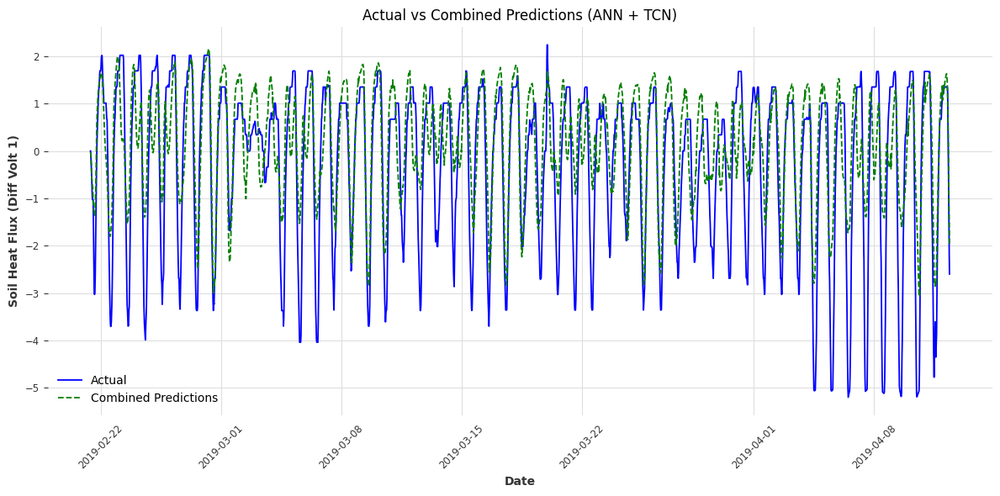

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import StandardScaler
from darts import TimeSeries
from darts.models import TCNModel

# Function to load data
def load_data(train_file, val_file):
    train_df = pd.read_csv(train_file)
    val_df = pd.read_csv(val_file)
    
    # Convert 'DateTime' column to datetime and set as index
    for df in [train_df, val_df]:
        df['DateTime'] = pd.to_datetime(df['DateTime'])
        df.set_index('DateTime', inplace=True)
    
    return train_df, val_df

# Load CSV data files (adjust paths as needed)
train_file = '/kaggle/input/forecastingtcn/train_transformed_10.csv'
val_file = '/kaggle/input/forecastingtcn/val_transformed_10.csv'
train_df, val_df = load_data(train_file, val_file)

# Select features and target
features = ['Month', 'VolSWC_20cm', 'Hour', 'SoilTemp_10cm', 'VolSWC_10cm',
            'SoilTemp_40cm', 'NET_Radiation', 'SoilTemp_20cm']
target = 'SoilHeatFlux_DiffVolt1'

X_train = train_df[features].values
y_train = train_df[target].values
X_val = val_df[features].values
y_val = val_df[target].values

# Normalize the data for ANN
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Build and train ANN model
ann_model = Sequential()
ann_model.add(Dense(64, activation='relu', input_dim=X_train_scaled.shape[1]))
ann_model.add(Dense(32, activation='relu'))
ann_model.add(Dense(1, activation='linear'))  # Output for regression
ann_model.compile(optimizer='adam', loss='mse')
ann_model.fit(X_train_scaled, y_train, validation_data=(X_val_scaled, y_val), epochs=100, batch_size=32, verbose=1)

# Get ANN predictions
ann_predictions = ann_model.predict(X_val_scaled)

# Prepare TimeSeries objects for TCN
train_series = TimeSeries.from_dataframe(train_df[features + [target]], freq='10T')
val_series = TimeSeries.from_dataframe(val_df[features + [target]], freq='10T')

# Initialize and train TCN model
tcn_model = TCNModel(
    input_chunk_length=60,
    output_chunk_length=1,
    n_epochs=10,
    dropout=0.05,
    dilation_base=3,
    weight_norm=True,
    kernel_size=5,
    num_filters=16,
    random_state=0
)
tcn_model.fit(series=train_series[target], val_series=val_series[target], verbose=True)

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(y_val), series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Combine predictions (Simple Averaging)
combined_predictions = (ann_predictions.flatten() + tcn_predictions_np.flatten()) / 2

# Plot actual vs combined predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, y_val, label='Actual', color='blue')
plt.plot(val_df.index, combined_predictions, label='Combined Predictions', color='green', linestyle='--')
plt.title('Actual vs Combined Predictions (ANN + TCN)')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Predicting: |          | 0/? [00:00<?, ?it/s]

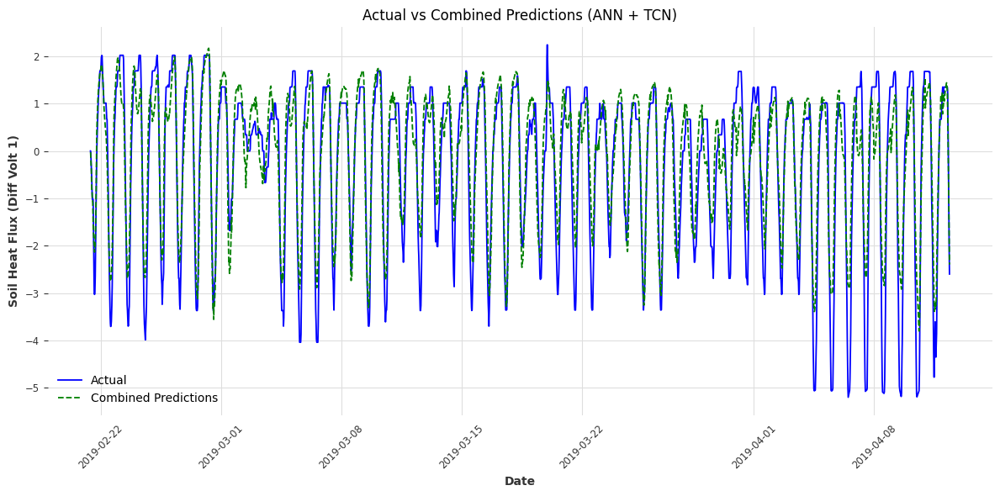

In [4]:
# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(y_val), series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Combine predictions 
combined_predictions = (0.7* ann_predictions.flatten()) + (0.3* tcn_predictions_np.flatten())


# Plot actual vs combined predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, y_val, label='Actual', color='blue')
plt.plot(val_df.index, combined_predictions, label='Combined Predictions', color='green', linestyle='--')
plt.title('Actual vs Combined Predictions (ANN + TCN)')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [5]:
print(combined_predictions.min())
print(combined_predictions.max())

-3.8029467322791284
2.16902027084509


In [6]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_val, combined_predictions)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_val, combined_predictions)

# Calculate R-squared (R²)
r2 = r2_score(y_val, combined_predictions)

# Print the evaluation metrics
print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R²): {r2}")


Mean Squared Error (MSE): 0.4885532362412557
Mean Absolute Error (MAE): 0.5434460287122895
R-squared (R²): 0.8334212145645985


Predicting: |          | 0/? [00:00<?, ?it/s]

135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Combined Predictions Range: -3.6001325876053367 2.1042413573907917
Past time index: DatetimeIndex(['2019-01-22 09:20:00', '2019-01-22 09:30:00',
               '2019-01-22 09:40:00', '2019-01-22 09:50:00',
               '2019-01-22 10:00:00', '2019-01-22 10:10:00',
               '2019-01-22 10:20:00', '2019-01-22 10:30:00',
               '2019-01-22 10:40:00', '2019-01-22 10:50:00',
               ...
               '2019-02-21 07:40:00', '2019-02-21 07:50:00',
               '2019-02-21 08:00:00', '2019-02-21 08:10:00',
               '2019-02-21 08:20:00', '2019-02-21 08:30:00',
               '2019-02-21 08:40:00', '2019-02-21 08:50:00',
               '2019-02-21 09:00:00', '2019-02-21 09:10:00'],
              dtype='datetime64[ns]', name='DateTime', length=4320, freq=None)
Future time index: DatetimeIndex(['2019-02-21 09:20:00', '2019-02-21 09:30:00',
               '2019-02-21 09:40:00', '2019-02-21 09:50:00',
               '2019-02-2

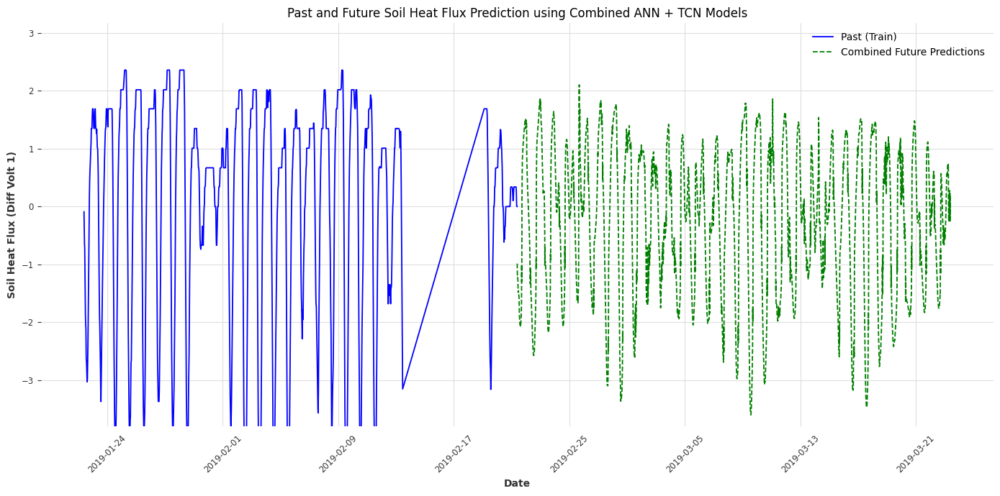

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator  # Import MaxNLocator

# Ensure the 'DateTime' column in train_df is a DateTimeIndex
if not isinstance(train_df.index, pd.DatetimeIndex):
    train_df['DateTime'] = pd.to_datetime(train_df['DateTime'])
    train_df.set_index('DateTime', inplace=True)

# Predict future values using both TCN and ANN models
n_future_steps = 144 * 30  # Number of future steps to predict

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Get ANN predictions
ann_predictions = ann_model.predict(X_val[:n_future_steps])  # Ensure that ann_predictions shape matches tcn_predictions

# Rescale predictions (optional, if scaling mismatch is suspected)
tcn_min, tcn_max = tcn_predictions_np.min(), tcn_predictions_np.max()
ann_min, ann_max = ann_predictions.min(), ann_predictions.max()

# Normalize both predictions to [0, 1] range
tcn_predictions_rescaled = (tcn_predictions_np - tcn_min) / (tcn_max - tcn_min)
ann_predictions_rescaled = (ann_predictions - ann_min) / (ann_max - ann_min)

# Combine predictions (weighted)
combined_predictions = (0.7 * ann_predictions_rescaled.flatten()) + (0.3 * tcn_predictions_rescaled.flatten())

# Scale combined predictions back to original range
combined_min = -3.8029467322791284
combined_max = 2.16902027084509
combined_predictions = combined_predictions * (combined_max - combined_min) + combined_min

# Clip combined predictions to avoid exceeding the known range
combined_predictions = np.clip(combined_predictions, combined_min, combined_max)

# Extract the last few rows from the training set to show past values
n_past = 144 * 30  # Number of past timesteps displayed
train_last_df = train_df[-n_past:]  # Get last rows directly from train_df

# Generate future time index based on the last datetime in train_last_df
last_date = train_last_df.index[-1]
future_dates = pd.date_range(last_date, periods=n_future_steps + 1, freq='10min')[1:]  # Add 10-min steps

# Check predictions and their range
print("Combined Predictions Range:", combined_predictions.min(), combined_predictions.max())
print("Past time index:", train_last_df.index)
print("Future time index:", future_dates)

# Plot past values (from training set) in blue and combined future predictions in green
plt.figure(figsize=(14, 7))  # Slightly larger figure size to avoid congestion

# Plot past values
plt.plot(train_last_df.index, train_last_df[target], color='blue', label='Past (Train)')  # Past values

# Plot combined future predictions
plt.plot(future_dates, combined_predictions, label='Combined Future Predictions', color='green', linestyle='--')

plt.title('Past and Future Soil Heat Flux Prediction using Combined ANN + TCN Models')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')

# Set legend location to the top right corner
plt.legend(loc='upper right')

# Format the x-axis to show the date and time
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Adjust the x-axis to use MinuteLocator for a better interval between ticks
plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=60))  # Tick every hour

# Use MaxNLocator to limit the number of x-ticks
plt.gca().xaxis.set_major_locator(MaxNLocator(nbins=10, integer=True))

# Rotate and format x-ticks
plt.xticks(rotation=45)

# Set y-axis limits to expected range
plt.ylim(combined_min, combined_max+1)  # Use the confirmed range

plt.tight_layout()
plt.show()


In [10]:
# Save the ANN model
ann_model.save('ann_model.h5')  # Save in HDF5 format
# Save the TCN model
tcn_model.save('tcn_model10.pth')  # Save in PyTorch format


Epoch 1/100


/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1051/1051 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.5975 - val_loss: 0.5629
Epoch 2/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0830 - val_loss: 0.5542
Epoch 3/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0638 - val_loss: 0.4405
Epoch 4/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0539 - val_loss: 0.4123
Epoch 5/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0479 - val_loss: 0.3647
Epoch 6/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0439 - val_loss: 0.2680
Epoch 7/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0400 - val_loss: 0.2529
Epoch 8/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0372 - val_loss: 0.2294
Epoch 9/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0351 - val_loss: 0.2396
Epoch 10/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0328 - val_loss: 0.2002
Epoch 11/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0325 - val_loss: 0.2106
Epoch 12/100
1051/1051 ━━━━━━━━

/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/torch/nn/utils/weight_norm.py:134: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

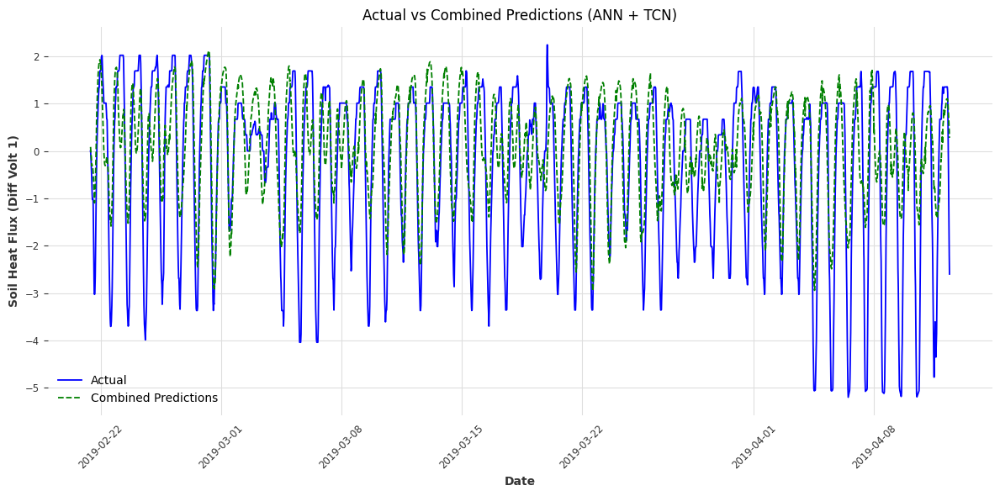

In [45]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import StandardScaler
from darts import TimeSeries
from darts.models import TCNModel

# Function to load data
def load_data(train_file, val_file):
    train_df = pd.read_csv(train_file)
    val_df = pd.read_csv(val_file)
    
    # Convert 'DateTime' column to datetime and set as index
    for df in [train_df, val_df]:
        df['DateTime'] = pd.to_datetime(df['DateTime'])
        df.set_index('DateTime', inplace=True)
    
    return train_df, val_df

# Load CSV data files (adjust paths as needed)
train_file = '/kaggle/input/forecastingtcn/train_transformed_10.csv'
val_file = '/kaggle/input/forecastingtcn/val_transformed_10.csv'
train_df, val_df = load_data(train_file, val_file)

# Select features and target
features = ['Month', 'VolSWC_20cm', 'Hour', 'SoilTemp_10cm', 'VolSWC_10cm',
            'SoilTemp_40cm', 'NET_Radiation', 'SoilTemp_20cm']
target = 'SoilHeatFlux_DiffVolt1'

X_train = train_df[features].values
y_train = train_df[target].values
X_val = val_df[features].values
y_val = val_df[target].values

# Normalize the data for ANN
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Build and train ANN model
ann_model = Sequential()
ann_model.add(Dense(64, activation='relu', input_dim=X_train_scaled.shape[1]))
ann_model.add(Dense(32, activation='relu'))
ann_model.add(Dense(1, activation='linear'))  # Output for regression
ann_model.compile(optimizer='adam', loss='mse')
ann_model.fit(X_train_scaled, y_train, validation_data=(X_val_scaled, y_val), epochs=100, batch_size=32, verbose=1)

# Get ANN predictions
ann_predictions = ann_model.predict(X_val_scaled)

# Prepare TimeSeries objects for TCN
train_series = TimeSeries.from_dataframe(train_df[features + [target]], freq='10T')
val_series = TimeSeries.from_dataframe(val_df[features + [target]], freq='10T')

# Initialize and train TCN model
tcn_model = TCNModel(
    input_chunk_length=60,
    output_chunk_length=1,
    n_epochs=50,
    dropout=0.05,
    dilation_base=3,
    weight_norm=True,
    kernel_size=5,
    num_filters=16,
    random_state=0
)
tcn_model.fit(series=train_series[target], val_series=val_series[target], verbose=True)

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(y_val), series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Combine predictions (Simple Averaging)
combined_predictions = (ann_predictions.flatten() + tcn_predictions_np.flatten()) / 2

# Plot actual vs combined predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, y_val, label='Actual', color='blue')
plt.plot(val_df.index, combined_predictions, label='Combined Predictions', color='green', linestyle='--')
plt.title('Actual vs Combined Predictions (ANN + TCN)')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Predicting: |          | 0/? [00:00<?, ?it/s]

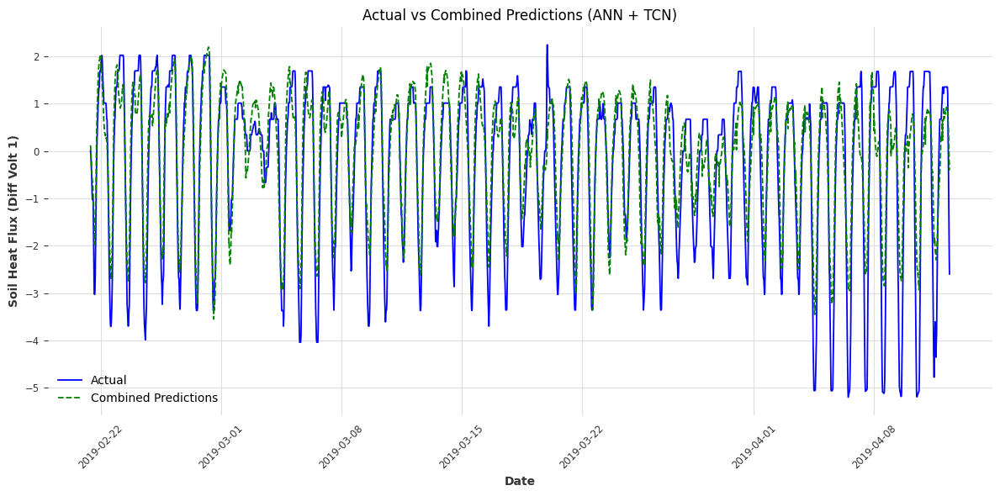

In [47]:
# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(y_val), series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Combine predictions 
combined_predictions = (0.7* ann_predictions.flatten()) + (0.3* tcn_predictions_np.flatten())


# Plot actual vs combined predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, y_val, label='Actual', color='blue')
plt.plot(val_df.index, combined_predictions, label='Combined Predictions', color='green', linestyle='--')
plt.title('Actual vs Combined Predictions (ANN + TCN)')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [48]:
print(combined_predictions.min())
print(combined_predictions.max())

-3.5497253618391786
2.1911731717772054


In [49]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_val, combined_predictions)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_val, combined_predictions)

# Calculate R-squared (R²)
r2 = r2_score(y_val, combined_predictions)

# Print the evaluation metrics
print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R²): {r2}")


Mean Squared Error (MSE): 0.5721847968612851
Mean Absolute Error (MAE): 0.5831941650030292
R-squared (R²): 0.8049059110956596


Predicting: |          | 0/? [00:00<?, ?it/s]

135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Combined Predictions Range: -2.541736384291493 2.1399339766722294
Past time index: DatetimeIndex(['2019-01-22 09:20:00', '2019-01-22 09:30:00',
               '2019-01-22 09:40:00', '2019-01-22 09:50:00',
               '2019-01-22 10:00:00', '2019-01-22 10:10:00',
               '2019-01-22 10:20:00', '2019-01-22 10:30:00',
               '2019-01-22 10:40:00', '2019-01-22 10:50:00',
               ...
               '2019-02-21 07:40:00', '2019-02-21 07:50:00',
               '2019-02-21 08:00:00', '2019-02-21 08:10:00',
               '2019-02-21 08:20:00', '2019-02-21 08:30:00',
               '2019-02-21 08:40:00', '2019-02-21 08:50:00',
               '2019-02-21 09:00:00', '2019-02-21 09:10:00'],
              dtype='datetime64[ns]', name='DateTime', length=4320, freq=None)
Future time index: DatetimeIndex(['2019-02-21 09:20:00', '2019-02-21 09:30:00',
               '2019-02-21 09:40:00', '2019-02-21 09:50:00',
               '2019-02-21

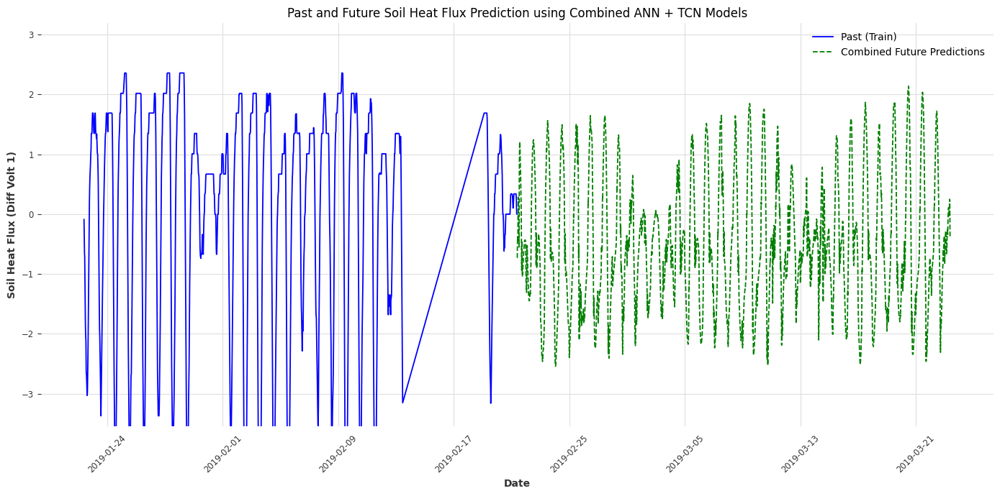

In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator  # Import MaxNLocator

# Ensure the 'DateTime' column in train_df is a DateTimeIndex
if not isinstance(train_df.index, pd.DatetimeIndex):
    train_df['DateTime'] = pd.to_datetime(train_df['DateTime'])
    train_df.set_index('DateTime', inplace=True)

# Predict future values using both TCN and ANN models
n_future_steps = 144 * 30  # Number of future steps to predict

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Get ANN predictions
ann_predictions = ann_model.predict(X_val[:n_future_steps])  # Ensure that ann_predictions shape matches tcn_predictions

# Rescale predictions (optional, if scaling mismatch is suspected)
tcn_min, tcn_max = tcn_predictions_np.min(), tcn_predictions_np.max()
ann_min, ann_max = ann_predictions.min(), ann_predictions.max()

# Normalize both predictions to [0, 1] range
tcn_predictions_rescaled = (tcn_predictions_np - tcn_min) / (tcn_max - tcn_min)
ann_predictions_rescaled = (ann_predictions - ann_min) / (ann_max - ann_min)

# Combine predictions (weighted)
combined_predictions = (0.7 * ann_predictions_rescaled.flatten()) + (0.3 * tcn_predictions_rescaled.flatten())

# Scale combined predictions back to original range
combined_min = -3.5497253618391786
combined_max = 2.1911731717772054
combined_predictions = combined_predictions * (combined_max - combined_min) + combined_min

# Clip combined predictions to avoid exceeding the known range
combined_predictions = np.clip(combined_predictions, combined_min, combined_max)

# Extract the last few rows from the training set to show past values
n_past = 144 * 30  # Number of past timesteps displayed
train_last_df = train_df[-n_past:]  # Get last rows directly from train_df

# Generate future time index based on the last datetime in train_last_df
last_date = train_last_df.index[-1]
future_dates = pd.date_range(last_date, periods=n_future_steps + 1, freq='10min')[1:]  # Add 10-min steps

# Check predictions and their range
print("Combined Predictions Range:", combined_predictions.min(), combined_predictions.max())
print("Past time index:", train_last_df.index)
print("Future time index:", future_dates)

# Plot past values (from training set) in blue and combined future predictions in green
plt.figure(figsize=(14, 7))  # Slightly larger figure size to avoid congestion

# Plot past values
plt.plot(train_last_df.index, train_last_df[target], color='blue', label='Past (Train)')  # Past values

# Plot combined future predictions
plt.plot(future_dates, combined_predictions, label='Combined Future Predictions', color='green', linestyle='--')

plt.title('Past and Future Soil Heat Flux Prediction using Combined ANN + TCN Models')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')

# Set legend location to the top right corner
plt.legend(loc='upper right')

# Format the x-axis to show the date and time
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Adjust the x-axis to use MinuteLocator for a better interval between ticks
plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=60))  # Tick every hour

# Use MaxNLocator to limit the number of x-ticks
plt.gca().xaxis.set_major_locator(MaxNLocator(nbins=10, integer=True))

# Rotate and format x-ticks
plt.xticks(rotation=45)

# Set y-axis limits to expected range
plt.ylim(combined_min, combined_max+1)  # Use the confirmed range

plt.tight_layout()
plt.show()


In [51]:
# Save the ANN model
ann_model.save('ann_model.h5')  # Save in HDF5 format
# Save the TCN model
tcn_model.save('tcn_model50.pth')  # Save in PyTorch format


Epoch 1/100


/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1051/1051 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.5916 - val_loss: 0.7442
Epoch 2/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0856 - val_loss: 0.4735
Epoch 3/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0664 - val_loss: 0.4704
Epoch 4/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0554 - val_loss: 0.3551
Epoch 5/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0485 - val_loss: 0.4044
Epoch 6/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0430 - val_loss: 0.4041
Epoch 7/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0399 - val_loss: 0.3103
Epoch 8/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0384 - val_loss: 0.2565
Epoch 9/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0377 - val_loss: 0.3401
Epoch 10/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0357 - val_loss: 0.2895
Epoch 11/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0327 - val_loss: 0.2926
Epoch 12/100
1051/1051 ━━━━━━━━

/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/torch/nn/utils/weight_norm.py:134: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

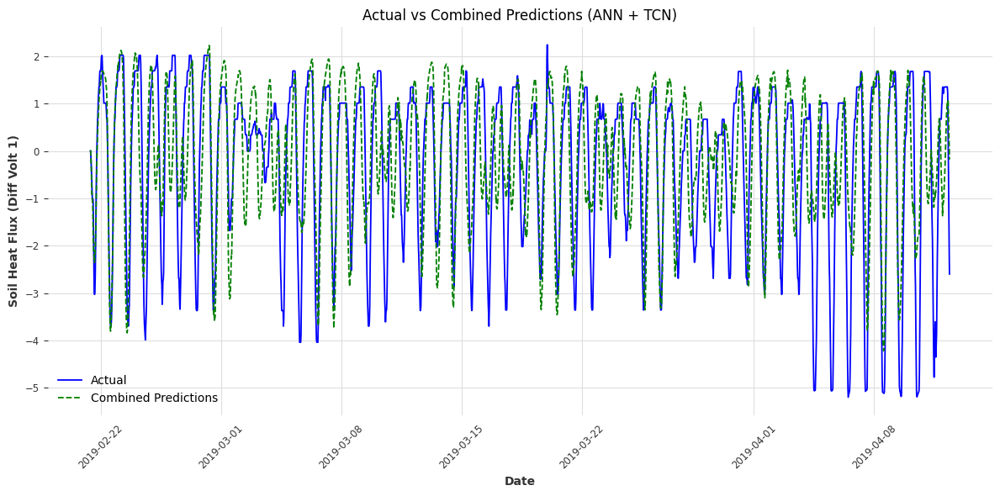

In [52]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import StandardScaler
from darts import TimeSeries
from darts.models import TCNModel

# Function to load data
def load_data(train_file, val_file):
    train_df = pd.read_csv(train_file)
    val_df = pd.read_csv(val_file)
    
    # Convert 'DateTime' column to datetime and set as index
    for df in [train_df, val_df]:
        df['DateTime'] = pd.to_datetime(df['DateTime'])
        df.set_index('DateTime', inplace=True)
    
    return train_df, val_df

# Load CSV data files (adjust paths as needed)
train_file = '/kaggle/input/forecastingtcn/train_transformed_10.csv'
val_file = '/kaggle/input/forecastingtcn/val_transformed_10.csv'
train_df, val_df = load_data(train_file, val_file)

# Select features and target
features = ['Month', 'VolSWC_20cm', 'Hour', 'SoilTemp_10cm', 'VolSWC_10cm',
            'SoilTemp_40cm', 'NET_Radiation', 'SoilTemp_20cm']
target = 'SoilHeatFlux_DiffVolt1'

X_train = train_df[features].values
y_train = train_df[target].values
X_val = val_df[features].values
y_val = val_df[target].values

# Normalize the data for ANN
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Build and train ANN model
ann_model = Sequential()
ann_model.add(Dense(64, activation='relu', input_dim=X_train_scaled.shape[1]))
ann_model.add(Dense(32, activation='relu'))
ann_model.add(Dense(1, activation='linear'))  # Output for regression
ann_model.compile(optimizer='adam', loss='mse')
ann_model.fit(X_train_scaled, y_train, validation_data=(X_val_scaled, y_val), epochs=100, batch_size=32, verbose=1)

# Get ANN predictions
ann_predictions = ann_model.predict(X_val_scaled)

# Prepare TimeSeries objects for TCN
train_series = TimeSeries.from_dataframe(train_df[features + [target]], freq='10T')
val_series = TimeSeries.from_dataframe(val_df[features + [target]], freq='10T')

# Initialize and train TCN model
tcn_model = TCNModel(
    input_chunk_length=60,
    output_chunk_length=1,
    n_epochs=75,
    dropout=0.05,
    dilation_base=3,
    weight_norm=True,
    kernel_size=5,
    num_filters=16,
    random_state=0
)
tcn_model.fit(series=train_series[target], val_series=val_series[target], verbose=True)

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(y_val), series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Combine predictions (Simple Averaging)
combined_predictions = (ann_predictions.flatten() + tcn_predictions_np.flatten()) / 2

# Plot actual vs combined predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, y_val, label='Actual', color='blue')
plt.plot(val_df.index, combined_predictions, label='Combined Predictions', color='green', linestyle='--')
plt.title('Actual vs Combined Predictions (ANN + TCN)')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Predicting: |          | 0/? [00:00<?, ?it/s]

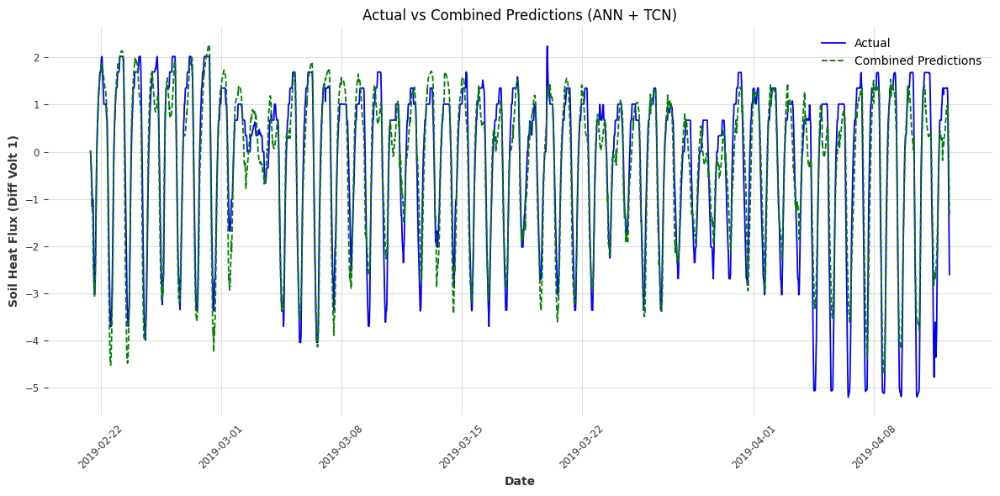

In [60]:
# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(y_val), series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Combine predictions 
combined_predictions = (0.8* ann_predictions.flatten()) + (0.2* tcn_predictions_np.flatten())


# Plot actual vs combined predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, y_val, label='Actual', color='blue')
plt.plot(val_df.index, combined_predictions, label='Combined Predictions', color='green', linestyle='--')
plt.title('Actual vs Combined Predictions (ANN + TCN)')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [61]:
print(combined_predictions.min())
print(combined_predictions.max())

-4.7059828870863605
2.266903592875199


In [62]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_val, combined_predictions)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_val, combined_predictions)

# Calculate R-squared (R²)
r2 = r2_score(y_val, combined_predictions)

# Print the evaluation metrics
print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R²): {r2}")


Mean Squared Error (MSE): 0.367975946507448
Mean Absolute Error (MAE): 0.47167509789080114
R-squared (R²): 0.8745336604251179


Predicting: |          | 0/? [00:00<?, ?it/s]

135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Combined Predictions Range: -4.622004239287207 2.1678152804417907
Past time index: DatetimeIndex(['2019-01-22 09:20:00', '2019-01-22 09:30:00',
               '2019-01-22 09:40:00', '2019-01-22 09:50:00',
               '2019-01-22 10:00:00', '2019-01-22 10:10:00',
               '2019-01-22 10:20:00', '2019-01-22 10:30:00',
               '2019-01-22 10:40:00', '2019-01-22 10:50:00',
               ...
               '2019-02-21 07:40:00', '2019-02-21 07:50:00',
               '2019-02-21 08:00:00', '2019-02-21 08:10:00',
               '2019-02-21 08:20:00', '2019-02-21 08:30:00',
               '2019-02-21 08:40:00', '2019-02-21 08:50:00',
               '2019-02-21 09:00:00', '2019-02-21 09:10:00'],
              dtype='datetime64[ns]', name='DateTime', length=4320, freq=None)
Future time index: DatetimeIndex(['2019-02-21 09:20:00', '2019-02-21 09:30:00',
               '2019-02-21 09:40:00', '2019-02-21 09:50:00',
               '2019-02-21

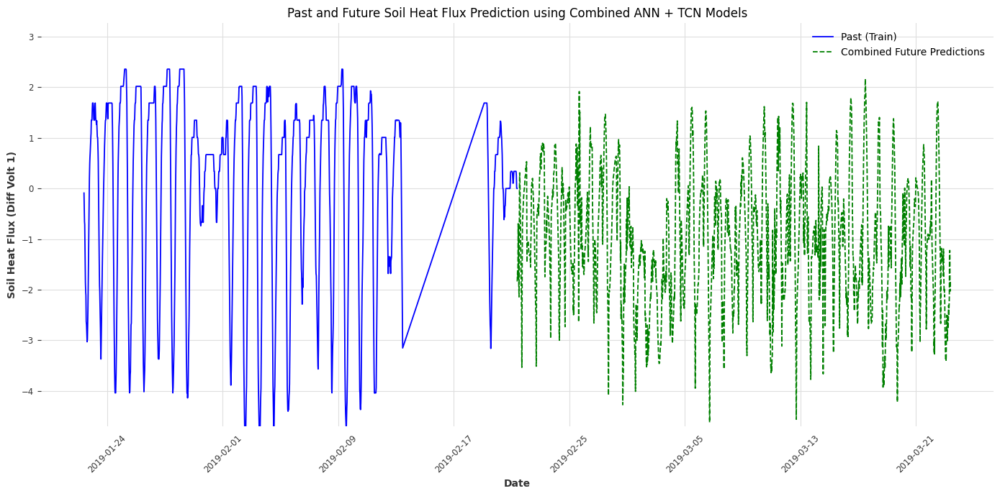

In [63]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator  # Import MaxNLocator

# Ensure the 'DateTime' column in train_df is a DateTimeIndex
if not isinstance(train_df.index, pd.DatetimeIndex):
    train_df['DateTime'] = pd.to_datetime(train_df['DateTime'])
    train_df.set_index('DateTime', inplace=True)

# Predict future values using both TCN and ANN models
n_future_steps = 144 * 30  # Number of future steps to predict

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Get ANN predictions
ann_predictions = ann_model.predict(X_val[:n_future_steps])  # Ensure that ann_predictions shape matches tcn_predictions

# Rescale predictions (optional, if scaling mismatch is suspected)
tcn_min, tcn_max = tcn_predictions_np.min(), tcn_predictions_np.max()
ann_min, ann_max = ann_predictions.min(), ann_predictions.max()

# Normalize both predictions to [0, 1] range
tcn_predictions_rescaled = (tcn_predictions_np - tcn_min) / (tcn_max - tcn_min)
ann_predictions_rescaled = (ann_predictions - ann_min) / (ann_max - ann_min)

# Combine predictions (weighted)
combined_predictions = (0.7 * ann_predictions_rescaled.flatten()) + (0.3 * tcn_predictions_rescaled.flatten())

# Scale combined predictions back to original range
combined_min = -4.7059828870863605
combined_max = 2.266903592875199
combined_predictions = combined_predictions * (combined_max - combined_min) + combined_min

# Clip combined predictions to avoid exceeding the known range
combined_predictions = np.clip(combined_predictions, combined_min, combined_max)

# Extract the last few rows from the training set to show past values
n_past = 144 * 30  # Number of past timesteps displayed
train_last_df = train_df[-n_past:]  # Get last rows directly from train_df

# Generate future time index based on the last datetime in train_last_df
last_date = train_last_df.index[-1]
future_dates = pd.date_range(last_date, periods=n_future_steps + 1, freq='10min')[1:]  # Add 10-min steps

# Check predictions and their range
print("Combined Predictions Range:", combined_predictions.min(), combined_predictions.max())
print("Past time index:", train_last_df.index)
print("Future time index:", future_dates)

# Plot past values (from training set) in blue and combined future predictions in green
plt.figure(figsize=(14, 7))  # Slightly larger figure size to avoid congestion

# Plot past values
plt.plot(train_last_df.index, train_last_df[target], color='blue', label='Past (Train)')  # Past values

# Plot combined future predictions
plt.plot(future_dates, combined_predictions, label='Combined Future Predictions', color='green', linestyle='--')

plt.title('Past and Future Soil Heat Flux Prediction using Combined ANN + TCN Models')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')

# Set legend location to the top right corner
plt.legend(loc='upper right')

# Format the x-axis to show the date and time
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Adjust the x-axis to use MinuteLocator for a better interval between ticks
plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=60))  # Tick every hour

# Use MaxNLocator to limit the number of x-ticks
plt.gca().xaxis.set_major_locator(MaxNLocator(nbins=10, integer=True))

# Rotate and format x-ticks
plt.xticks(rotation=45)

# Set y-axis limits to expected range
plt.ylim(combined_min, combined_max+1)  # Use the confirmed range

plt.tight_layout()
plt.show()


In [64]:
# Save the ANN model
ann_model.save('ann_model.h5')  # Save in HDF5 format
# Save the TCN model
tcn_model.save('tcn_model75.pth')  # Save in PyTorch format


Epoch 1/100


/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1051/1051 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.6183 - val_loss: 0.6406
Epoch 2/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0870 - val_loss: 0.4421
Epoch 3/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0677 - val_loss: 0.5247
Epoch 4/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0572 - val_loss: 0.4103
Epoch 5/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0504 - val_loss: 0.3372
Epoch 6/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0420 - val_loss: 0.2710
Epoch 7/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0397 - val_loss: 0.2235
Epoch 8/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0382 - val_loss: 0.2749
Epoch 9/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0360 - val_loss: 0.2313
Epoch 10/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0337 - val_loss: 0.2032
Epoch 11/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0341 - val_loss: 0.1657
Epoch 12/100
1051/1051 ━━━━━━━━

/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/torch/nn/utils/weight_norm.py:134: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

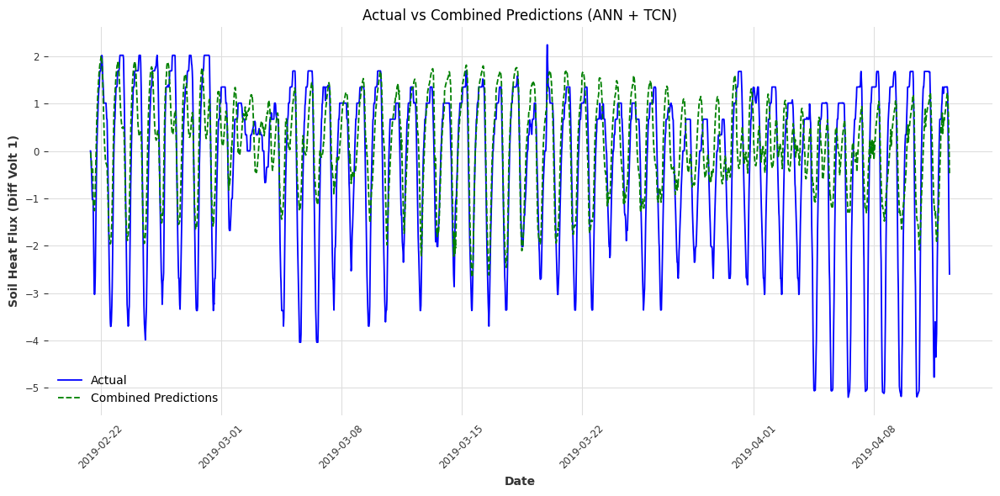

In [65]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import StandardScaler
from darts import TimeSeries
from darts.models import TCNModel

# Function to load data
def load_data(train_file, val_file):
    train_df = pd.read_csv(train_file)
    val_df = pd.read_csv(val_file)
    
    # Convert 'DateTime' column to datetime and set as index
    for df in [train_df, val_df]:
        df['DateTime'] = pd.to_datetime(df['DateTime'])
        df.set_index('DateTime', inplace=True)
    
    return train_df, val_df

# Load CSV data files (adjust paths as needed)
train_file = '/kaggle/input/forecastingtcn/train_transformed_10.csv'
val_file = '/kaggle/input/forecastingtcn/val_transformed_10.csv'
train_df, val_df = load_data(train_file, val_file)

# Select features and target
features = ['Month', 'VolSWC_20cm', 'Hour', 'SoilTemp_10cm', 'VolSWC_10cm',
            'SoilTemp_40cm', 'NET_Radiation', 'SoilTemp_20cm']
target = 'SoilHeatFlux_DiffVolt1'

X_train = train_df[features].values
y_train = train_df[target].values
X_val = val_df[features].values
y_val = val_df[target].values

# Normalize the data for ANN
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Build and train ANN model
ann_model = Sequential()
ann_model.add(Dense(64, activation='relu', input_dim=X_train_scaled.shape[1]))
ann_model.add(Dense(32, activation='relu'))
ann_model.add(Dense(1, activation='linear'))  # Output for regression
ann_model.compile(optimizer='adam', loss='mse')
ann_model.fit(X_train_scaled, y_train, validation_data=(X_val_scaled, y_val), epochs=100, batch_size=32, verbose=1)

# Get ANN predictions
ann_predictions = ann_model.predict(X_val_scaled)

# Prepare TimeSeries objects for TCN
train_series = TimeSeries.from_dataframe(train_df[features + [target]], freq='10T')
val_series = TimeSeries.from_dataframe(val_df[features + [target]], freq='10T')

# Initialize and train TCN model
tcn_model = TCNModel(
    input_chunk_length=60,
    output_chunk_length=1,
    n_epochs=100,
    dropout=0.05,
    dilation_base=3,
    weight_norm=True,
    kernel_size=5,
    num_filters=16,
    random_state=0
)
tcn_model.fit(series=train_series[target], val_series=val_series[target], verbose=True)

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(y_val), series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Combine predictions (Simple Averaging)
combined_predictions = (ann_predictions.flatten() + tcn_predictions_np.flatten()) / 2

# Plot actual vs combined predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, y_val, label='Actual', color='blue')
plt.plot(val_df.index, combined_predictions, label='Combined Predictions', color='green', linestyle='--')
plt.title('Actual vs Combined Predictions (ANN + TCN)')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Predicting: |          | 0/? [00:00<?, ?it/s]

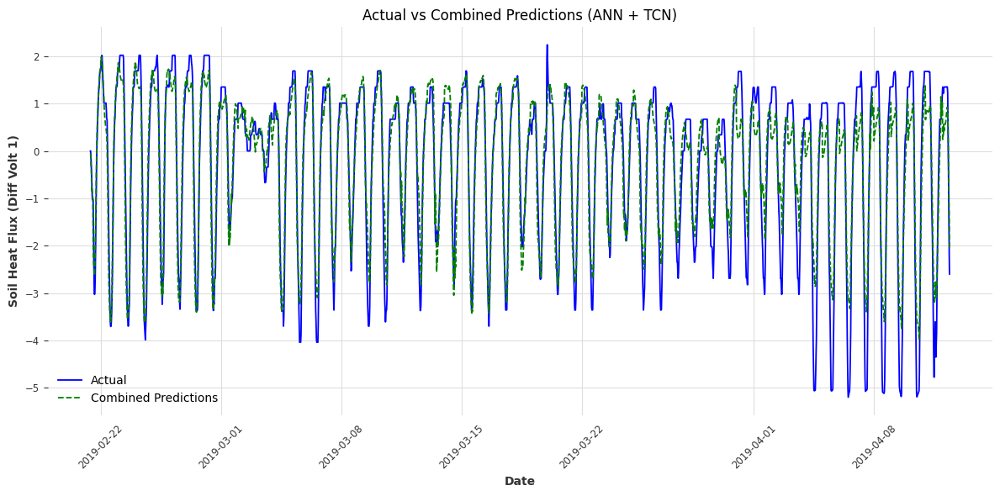

In [66]:
# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(y_val), series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Combine predictions 
combined_predictions = (0.8* ann_predictions.flatten()) + (0.2* tcn_predictions_np.flatten())


# Plot actual vs combined predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, y_val, label='Actual', color='blue')
plt.plot(val_df.index, combined_predictions, label='Combined Predictions', color='green', linestyle='--')
plt.title('Actual vs Combined Predictions (ANN + TCN)')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [67]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_val, combined_predictions)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_val, combined_predictions)

# Calculate R-squared (R²)
r2 = r2_score(y_val, combined_predictions)

# Print the evaluation metrics
print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R²): {r2}")


Mean Squared Error (MSE): 0.3368231796861225
Mean Absolute Error (MAE): 0.4282529528270617
R-squared (R²): 0.8851556145441284


In [68]:
print(combined_predictions.min())
print(combined_predictions.max())

-3.9668617255814724
1.982278212648319


Predicting: |          | 0/? [00:00<?, ?it/s]

135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Combined Predictions Range: -3.779437575230458 1.968889398041695
Past time index: DatetimeIndex(['2019-01-22 09:20:00', '2019-01-22 09:30:00',
               '2019-01-22 09:40:00', '2019-01-22 09:50:00',
               '2019-01-22 10:00:00', '2019-01-22 10:10:00',
               '2019-01-22 10:20:00', '2019-01-22 10:30:00',
               '2019-01-22 10:40:00', '2019-01-22 10:50:00',
               ...
               '2019-02-21 07:40:00', '2019-02-21 07:50:00',
               '2019-02-21 08:00:00', '2019-02-21 08:10:00',
               '2019-02-21 08:20:00', '2019-02-21 08:30:00',
               '2019-02-21 08:40:00', '2019-02-21 08:50:00',
               '2019-02-21 09:00:00', '2019-02-21 09:10:00'],
              dtype='datetime64[ns]', name='DateTime', length=4320, freq=None)
Future time index: DatetimeIndex(['2019-02-21 09:20:00', '2019-02-21 09:30:00',
               '2019-02-21 09:40:00', '2019-02-21 09:50:00',
               '2019-02-21 

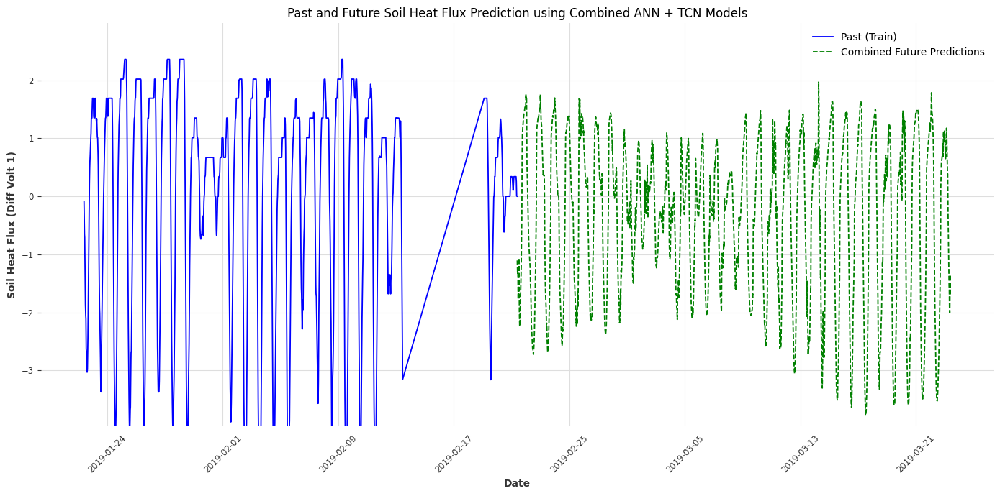

In [69]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator  # Import MaxNLocator

# Ensure the 'DateTime' column in train_df is a DateTimeIndex
if not isinstance(train_df.index, pd.DatetimeIndex):
    train_df['DateTime'] = pd.to_datetime(train_df['DateTime'])
    train_df.set_index('DateTime', inplace=True)

# Predict future values using both TCN and ANN models
n_future_steps = 144 * 30  # Number of future steps to predict

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Get ANN predictions
ann_predictions = ann_model.predict(X_val[:n_future_steps])  # Ensure that ann_predictions shape matches tcn_predictions

# Rescale predictions (optional, if scaling mismatch is suspected)
tcn_min, tcn_max = tcn_predictions_np.min(), tcn_predictions_np.max()
ann_min, ann_max = ann_predictions.min(), ann_predictions.max()

# Normalize both predictions to [0, 1] range
tcn_predictions_rescaled = (tcn_predictions_np - tcn_min) / (tcn_max - tcn_min)
ann_predictions_rescaled = (ann_predictions - ann_min) / (ann_max - ann_min)

# Combine predictions (weighted)
combined_predictions = (0.7 * ann_predictions_rescaled.flatten()) + (0.3 * tcn_predictions_rescaled.flatten())

# Scale combined predictions back to original range
combined_min = -3.9668617255814724
combined_max = 1.982278212648319
combined_predictions = combined_predictions * (combined_max - combined_min) + combined_min

# Clip combined predictions to avoid exceeding the known range
combined_predictions = np.clip(combined_predictions, combined_min, combined_max)

# Extract the last few rows from the training set to show past values
n_past = 144 * 30  # Number of past timesteps displayed
train_last_df = train_df[-n_past:]  # Get last rows directly from train_df

# Generate future time index based on the last datetime in train_last_df
last_date = train_last_df.index[-1]
future_dates = pd.date_range(last_date, periods=n_future_steps + 1, freq='10min')[1:]  # Add 10-min steps

# Check predictions and their range
print("Combined Predictions Range:", combined_predictions.min(), combined_predictions.max())
print("Past time index:", train_last_df.index)
print("Future time index:", future_dates)

# Plot past values (from training set) in blue and combined future predictions in green
plt.figure(figsize=(14, 7))  # Slightly larger figure size to avoid congestion

# Plot past values
plt.plot(train_last_df.index, train_last_df[target], color='blue', label='Past (Train)')  # Past values

# Plot combined future predictions
plt.plot(future_dates, combined_predictions, label='Combined Future Predictions', color='green', linestyle='--')

plt.title('Past and Future Soil Heat Flux Prediction using Combined ANN + TCN Models')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')

# Set legend location to the top right corner
plt.legend(loc='upper right')

# Format the x-axis to show the date and time
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Adjust the x-axis to use MinuteLocator for a better interval between ticks
plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=60))  # Tick every hour

# Use MaxNLocator to limit the number of x-ticks
plt.gca().xaxis.set_major_locator(MaxNLocator(nbins=10, integer=True))

# Rotate and format x-ticks
plt.xticks(rotation=45)

# Set y-axis limits to expected range
plt.ylim(combined_min, combined_max+1)  # Use the confirmed range

plt.tight_layout()
plt.show()


In [2]:
!pip install darts

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.2/52.2 kB 795.2 kB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.8/165.8 kB 2.5 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 917.3/917.3 kB 10.8 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 33.3 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 314.7/314.7 kB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.7/196.7 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.2/278.2 kB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.3

/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100


I0000 00:00:1727947910.023276     163 service.cc:145] XLA service 0x7b2058006840 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1727947910.023322     163 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1727947910.023325     163 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


 119/1051 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 1.6951

I0000 00:00:1727947911.629598     163 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1051/1051 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.6074 - val_loss: 0.5431
Epoch 2/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0892 - val_loss: 0.3906
Epoch 3/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0644 - val_loss: 0.2739
Epoch 4/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0554 - val_loss: 0.2248
Epoch 5/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0465 - val_loss: 0.1887
Epoch 6/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0445 - val_loss: 0.2145
Epoch 7/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0396 - val_loss: 0.2381
Epoch 8/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0372 - val_loss: 0.1550
Epoch 9/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0345 - val_loss: 0.2168
Epoch 10/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0334 - val_loss: 0.1733
Epoch 11/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0334 - val_loss: 0.1603
Epoch 12/100
1051/1051 ━━━━━━━━

/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/torch/random.py:167: UserWarning: CUDA reports that you have 2 available devices, and you have used fork_rng without explicitly specifying which devices are being used. For safety, we initialize *every* CUDA device by default, which can be quite slow if you have a lot of CUDAs. If you know that you are only making use of a few CUDA devices, set the environment variable CUDA_VISIBLE_DEVICES or the 'devices' keyword argument of fork_rng with the set of devices you are actually using. For example, if you are

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

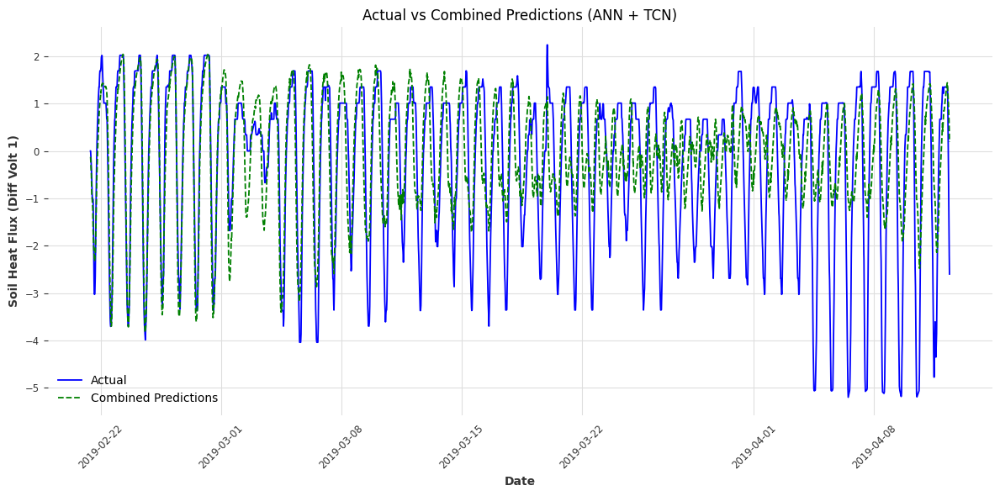

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import StandardScaler
from darts import TimeSeries
from darts.models import TCNModel

# Function to load data
def load_data(train_file, val_file):
    train_df = pd.read_csv(train_file)
    val_df = pd.read_csv(val_file)
    
    # Convert 'DateTime' column to datetime and set as index
    for df in [train_df, val_df]:
        df['DateTime'] = pd.to_datetime(df['DateTime'])
        df.set_index('DateTime', inplace=True)
    
    return train_df, val_df

# Load CSV data files (adjust paths as needed)
train_file = '/kaggle/input/forecastingtcn/train_transformed_10.csv'
val_file = '/kaggle/input/forecastingtcn/val_transformed_10.csv'
train_df, val_df = load_data(train_file, val_file)

# Select features and target
features = ['Month', 'VolSWC_20cm', 'Hour', 'SoilTemp_10cm', 'VolSWC_10cm',
            'SoilTemp_40cm', 'NET_Radiation', 'SoilTemp_20cm']
target = 'SoilHeatFlux_DiffVolt1'

X_train = train_df[features].values
y_train = train_df[target].values
X_val = val_df[features].values
y_val = val_df[target].values

# Normalize the data for ANN
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Build and train ANN model
ann_model = Sequential()
ann_model.add(Dense(64, activation='relu', input_dim=X_train_scaled.shape[1]))
ann_model.add(Dense(32, activation='relu'))
ann_model.add(Dense(1, activation='linear'))  # Output for regression
ann_model.compile(optimizer='adam', loss='mse')
ann_model.fit(X_train_scaled, y_train, validation_data=(X_val_scaled, y_val), epochs=100, batch_size=32, verbose=1)

# Get ANN predictions
ann_predictions = ann_model.predict(X_val_scaled)

# Prepare TimeSeries objects for TCN
train_series = TimeSeries.from_dataframe(train_df[features + [target]], freq='10T')
val_series = TimeSeries.from_dataframe(val_df[features + [target]], freq='10T')

# Initialize and train TCN model
tcn_model = TCNModel(
    input_chunk_length=60,
    output_chunk_length=1,
    n_epochs=85,
    dropout=0.05,
    dilation_base=3,
    weight_norm=True,
    kernel_size=5,
    num_filters=16,
    random_state=0
)
tcn_model.fit(series=train_series[target], val_series=val_series[target], verbose=True)

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(y_val), series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Combine predictions (Simple Averaging)
combined_predictions = (ann_predictions.flatten() + tcn_predictions_np.flatten()) / 2

# Plot actual vs combined predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, y_val, label='Actual', color='blue')
plt.plot(val_df.index, combined_predictions, label='Combined Predictions', color='green', linestyle='--')
plt.title('Actual vs Combined Predictions (ANN + TCN)')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Predicting: |          | 0/? [00:00<?, ?it/s]

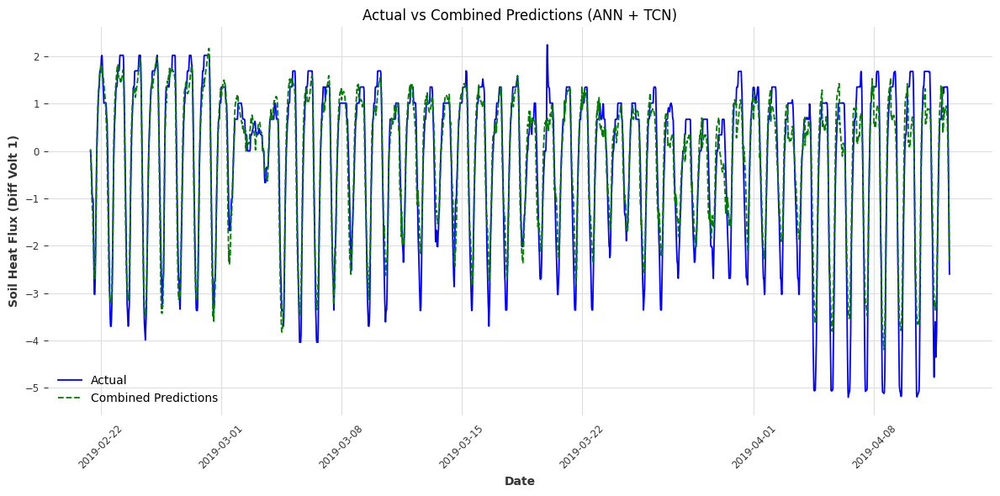

In [82]:
# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(y_val), series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Combine predictions 
combined_predictions = (0.8* ann_predictions.flatten()) + (0.2* tcn_predictions_np.flatten())


# Plot actual vs combined predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, y_val, label='Actual', color='blue')
plt.plot(val_df.index, combined_predictions, label='Combined Predictions', color='green', linestyle='--')
plt.title('Actual vs Combined Predictions (ANN + TCN)')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [83]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_val, combined_predictions)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_val, combined_predictions)

# Calculate R-squared (R²)
r2 = r2_score(y_val, combined_predictions)

# Print the evaluation metrics
print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R²): {r2}")


Mean Squared Error (MSE): 0.29208931131264326
Mean Absolute Error (MAE): 0.41118781607332155
R-squared (R²): 0.9004082275834195


In [84]:
print(combined_predictions.min())
print(combined_predictions.max())

-4.1943534934780935
2.16598266639883


Predicting: |          | 0/? [00:00<?, ?it/s]

135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Combined Predictions Range: -3.8947065676943677 2.1520807205399546
Past time index: DatetimeIndex(['2019-01-22 09:20:00', '2019-01-22 09:30:00',
               '2019-01-22 09:40:00', '2019-01-22 09:50:00',
               '2019-01-22 10:00:00', '2019-01-22 10:10:00',
               '2019-01-22 10:20:00', '2019-01-22 10:30:00',
               '2019-01-22 10:40:00', '2019-01-22 10:50:00',
               ...
               '2019-02-21 07:40:00', '2019-02-21 07:50:00',
               '2019-02-21 08:00:00', '2019-02-21 08:10:00',
               '2019-02-21 08:20:00', '2019-02-21 08:30:00',
               '2019-02-21 08:40:00', '2019-02-21 08:50:00',
               '2019-02-21 09:00:00', '2019-02-21 09:10:00'],
              dtype='datetime64[ns]', name='DateTime', length=4320, freq=None)
Future time index: DatetimeIndex(['2019-02-21 09:20:00', '2019-02-21 09:30:00',
               '2019-02-21 09:40:00', '2019-02-21 09:50:00',
               '2019-02-2

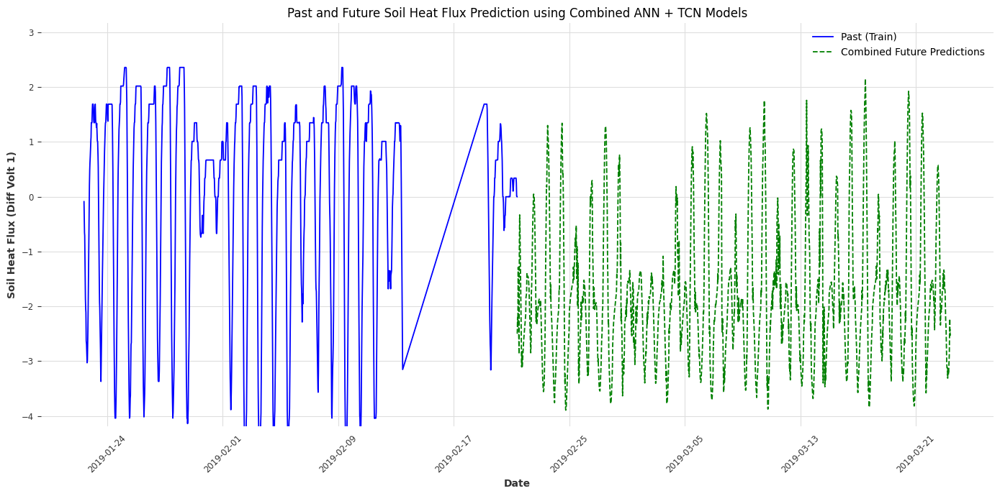

In [85]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator  # Import MaxNLocator

# Ensure the 'DateTime' column in train_df is a DateTimeIndex
if not isinstance(train_df.index, pd.DatetimeIndex):
    train_df['DateTime'] = pd.to_datetime(train_df['DateTime'])
    train_df.set_index('DateTime', inplace=True)

# Predict future values using both TCN and ANN models
n_future_steps = 144 * 30  # Number of future steps to predict

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Get ANN predictions
ann_predictions = ann_model.predict(X_val[:n_future_steps])  # Ensure that ann_predictions shape matches tcn_predictions

# Rescale predictions (optional, if scaling mismatch is suspected)
tcn_min, tcn_max = tcn_predictions_np.min(), tcn_predictions_np.max()
ann_min, ann_max = ann_predictions.min(), ann_predictions.max()

# Normalize both predictions to [0, 1] range
tcn_predictions_rescaled = (tcn_predictions_np - tcn_min) / (tcn_max - tcn_min)
ann_predictions_rescaled = (ann_predictions - ann_min) / (ann_max - ann_min)

# Combine predictions (weighted)
combined_predictions = (0.8 * ann_predictions_rescaled.flatten()) + (0.2 * tcn_predictions_rescaled.flatten())

# Scale combined predictions back to original range
combined_min = -4.1943534934780935
combined_max = 2.16598266639883
combined_predictions = combined_predictions * (combined_max - combined_min) + combined_min

# Clip combined predictions to avoid exceeding the known range
combined_predictions = np.clip(combined_predictions, combined_min, combined_max)

# Extract the last few rows from the training set to show past values
n_past = 144 * 30  # Number of past timesteps displayed
train_last_df = train_df[-n_past:]  # Get last rows directly from train_df

# Generate future time index based on the last datetime in train_last_df
last_date = train_last_df.index[-1]
future_dates = pd.date_range(last_date, periods=n_future_steps + 1, freq='10min')[1:]  # Add 10-min steps

# Check predictions and their range
print("Combined Predictions Range:", combined_predictions.min(), combined_predictions.max())
print("Past time index:", train_last_df.index)
print("Future time index:", future_dates)

# Plot past values (from training set) in blue and combined future predictions in green
plt.figure(figsize=(14, 7))  # Slightly larger figure size to avoid congestion

# Plot past values
plt.plot(train_last_df.index, train_last_df[target], color='blue', label='Past (Train)')  # Past values

# Plot combined future predictions
plt.plot(future_dates, combined_predictions, label='Combined Future Predictions', color='green', linestyle='--')

plt.title('Past and Future Soil Heat Flux Prediction using Combined ANN + TCN Models')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')

# Set legend location to the top right corner
plt.legend(loc='upper right')

# Format the x-axis to show the date and time
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Adjust the x-axis to use MinuteLocator for a better interval between ticks
plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=60))  # Tick every hour

# Use MaxNLocator to limit the number of x-ticks
plt.gca().xaxis.set_major_locator(MaxNLocator(nbins=10, integer=True))

# Rotate and format x-ticks
plt.xticks(rotation=45)

# Set y-axis limits to expected range
plt.ylim(combined_min, combined_max+1)  # Use the confirmed range

plt.tight_layout()
plt.show()


In [86]:
# Save the ANN model
ann_model.save('ann_model.h5')  # Save in HDF5 format
# Save the TCN model
tcn_model.save('tcn_model85.pth')  # Save in PyTorch format


Predicting: |          | 0/? [00:00<?, ?it/s]

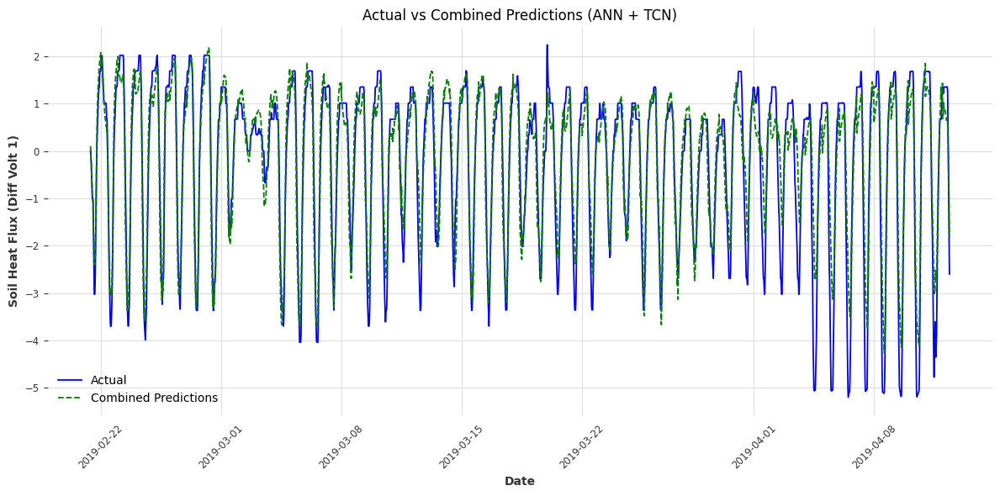

In [94]:
# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(y_val), series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Combine predictions 
combined_predictions = (0.8* ann_predictions.flatten()) + (0.2* tcn_predictions_np.flatten())


# Plot actual vs combined predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, y_val, label='Actual', color='blue')
plt.plot(val_df.index, combined_predictions, label='Combined Predictions', color='green', linestyle='--')
plt.title('Actual vs Combined Predictions (ANN + TCN)')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [95]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_val, combined_predictions)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_val, combined_predictions)

# Calculate R-squared (R²)
r2 = r2_score(y_val, combined_predictions)

# Print the evaluation metrics
print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R²): {r2}")


Mean Squared Error (MSE): 0.35992468362697083
Mean Absolute Error (MAE): 0.43351513055020463
R-squared (R²): 0.8772788466041503


In [96]:
print(combined_predictions.min())
print(combined_predictions.max())

-4.263971124891198
2.1754100844238735


Predicting: |          | 0/? [00:00<?, ?it/s]

135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Combined Predictions Range: -3.9691213306458724 2.1296649044024516
Past time index: DatetimeIndex(['2019-01-22 09:20:00', '2019-01-22 09:30:00',
               '2019-01-22 09:40:00', '2019-01-22 09:50:00',
               '2019-01-22 10:00:00', '2019-01-22 10:10:00',
               '2019-01-22 10:20:00', '2019-01-22 10:30:00',
               '2019-01-22 10:40:00', '2019-01-22 10:50:00',
               ...
               '2019-02-21 07:40:00', '2019-02-21 07:50:00',
               '2019-02-21 08:00:00', '2019-02-21 08:10:00',
               '2019-02-21 08:20:00', '2019-02-21 08:30:00',
               '2019-02-21 08:40:00', '2019-02-21 08:50:00',
               '2019-02-21 09:00:00', '2019-02-21 09:10:00'],
              dtype='datetime64[ns]', name='DateTime', length=4320, freq=None)
Future time index: DatetimeIndex(['2019-02-21 09:20:00', '2019-02-21 09:30:00',
               '2019-02-21 09:40:00', '2019-02-21 09:50:00',
               '2019-02-2

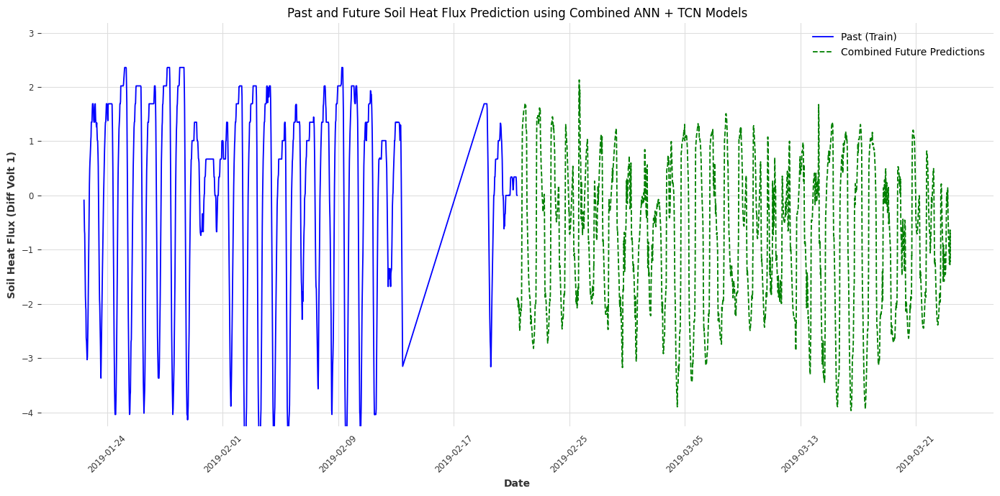

In [97]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator  # Import MaxNLocator

# Ensure the 'DateTime' column in train_df is a DateTimeIndex
if not isinstance(train_df.index, pd.DatetimeIndex):
    train_df['DateTime'] = pd.to_datetime(train_df['DateTime'])
    train_df.set_index('DateTime', inplace=True)

# Predict future values using both TCN and ANN models
n_future_steps = 144 * 30  # Number of future steps to predict

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Get ANN predictions
ann_predictions = ann_model.predict(X_val[:n_future_steps])  # Ensure that ann_predictions shape matches tcn_predictions

# Rescale predictions (optional, if scaling mismatch is suspected)
tcn_min, tcn_max = tcn_predictions_np.min(), tcn_predictions_np.max()
ann_min, ann_max = ann_predictions.min(), ann_predictions.max()

# Normalize both predictions to [0, 1] range
tcn_predictions_rescaled = (tcn_predictions_np - tcn_min) / (tcn_max - tcn_min)
ann_predictions_rescaled = (ann_predictions - ann_min) / (ann_max - ann_min)

# Combine predictions (weighted)
combined_predictions = (0.7 * ann_predictions_rescaled.flatten()) + (0.3 * tcn_predictions_rescaled.flatten())

# Scale combined predictions back to original range
combined_min = -4.263971124891198
combined_max = 2.1754100844238735
combined_predictions = combined_predictions * (combined_max - combined_min) + combined_min

# Clip combined predictions to avoid exceeding the known range
combined_predictions = np.clip(combined_predictions, combined_min, combined_max)

# Extract the last few rows from the training set to show past values
n_past = 144 * 30  # Number of past timesteps displayed
train_last_df = train_df[-n_past:]  # Get last rows directly from train_df

# Generate future time index based on the last datetime in train_last_df
last_date = train_last_df.index[-1]
future_dates = pd.date_range(last_date, periods=n_future_steps + 1, freq='10min')[1:]  # Add 10-min steps

# Check predictions and their range
print("Combined Predictions Range:", combined_predictions.min(), combined_predictions.max())
print("Past time index:", train_last_df.index)
print("Future time index:", future_dates)

# Plot past values (from training set) in blue and combined future predictions in green
plt.figure(figsize=(14, 7))  # Slightly larger figure size to avoid congestion

# Plot past values
plt.plot(train_last_df.index, train_last_df[target], color='blue', label='Past (Train)')  # Past values

# Plot combined future predictions
plt.plot(future_dates, combined_predictions, label='Combined Future Predictions', color='green', linestyle='--')

plt.title('Past and Future Soil Heat Flux Prediction using Combined ANN + TCN Models')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')

# Set legend location to the top right corner
plt.legend(loc='upper right')

# Format the x-axis to show the date and time
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Adjust the x-axis to use MinuteLocator for a better interval between ticks
plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=60))  # Tick every hour

# Use MaxNLocator to limit the number of x-ticks
plt.gca().xaxis.set_major_locator(MaxNLocator(nbins=10, integer=True))

# Rotate and format x-ticks
plt.xticks(rotation=45)

# Set y-axis limits to expected range
plt.ylim(combined_min, combined_max+1)  # Use the confirmed range

plt.tight_layout()
plt.show()


In [29]:
!pip install ipywidgets


/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/torch/nn/utils/weight_norm.py:134: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

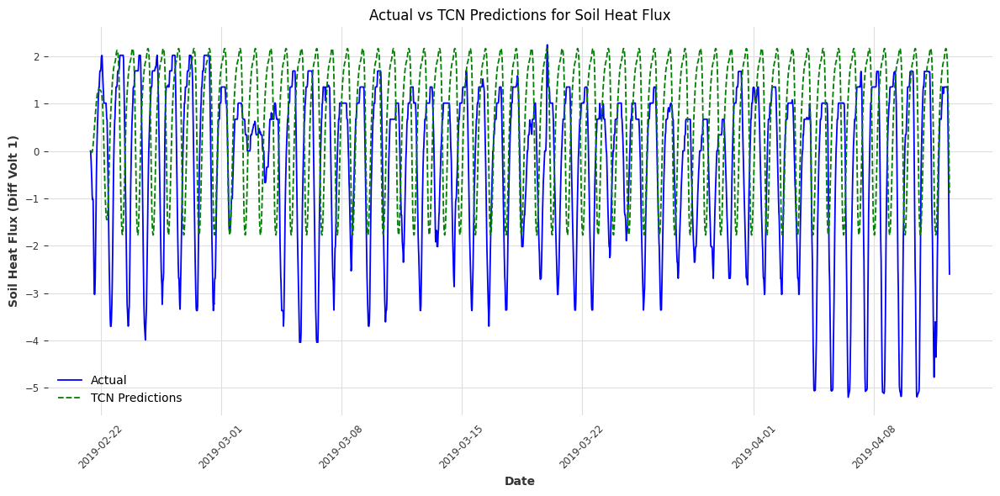

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from darts import TimeSeries
from darts.models import TCNModel

# Function to load data
def load_data(train_file, val_file):
    train_df = pd.read_csv(train_file)
    val_df = pd.read_csv(val_file)
    
    # Convert 'DateTime' column to datetime and set as index
    for df in [train_df, val_df]:
        df['DateTime'] = pd.to_datetime(df['DateTime'])
        df.set_index('DateTime', inplace=True)
    
    return train_df, val_df

# Load CSV data files (adjust paths as needed)
train_file = '/kaggle/input/forecastingtcn/train_transformed_10.csv'
val_file = '/kaggle/input/forecastingtcn/val_transformed_10.csv'
train_df, val_df = load_data(train_file, val_file)

# Select features and target
features = ['Month', 'VolSWC_20cm', 'Hour', 'SoilTemp_10cm', 'VolSWC_10cm',
            'SoilTemp_40cm', 'NET_Radiation', 'SoilTemp_20cm']
target = 'SoilHeatFlux_DiffVolt1'

# Prepare TimeSeries objects for TCN
train_series = TimeSeries.from_dataframe(train_df[features + [target]], freq='10T')
val_series = TimeSeries.from_dataframe(val_df[features + [target]], freq='10T')

# Initialize and train TCN model
tcn_model = TCNModel(
    input_chunk_length=60,
    output_chunk_length=1,
    n_epochs=10,
    dropout=0.05,
    dilation_base=3,
    weight_norm=True,
    kernel_size=5,
    num_filters=16,
    random_state=0
)
tcn_model.fit(series=train_series[target], val_series=val_series[target], verbose=True)

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(val_df), series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Plot actual vs TCN predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, val_df[target].values, label='Actual', color='blue')
plt.plot(val_df.index, tcn_predictions_np, label='TCN Predictions', color='green', linestyle='--')
plt.title('Actual vs TCN Predictions for Soil Heat Flux')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [33]:
X_train = train_df[features].values
y_train = train_df[target].values
X_val = val_df[features].values
y_val = val_df[target].values

# Normalize the data for ANN
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_val, tcn_predictions)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_val, tcn_predictions)

# Calculate R-squared (R²)
r2 = r2_score(y_val, tcn_predictions)

# Print the evaluation metrics
print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R²): {r2}")


In [ ]:
print(combined_predictions.min())
print(combined_predictions.max())

In [20]:
!pip install darts

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.2/52.2 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.8/165.8 kB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 917.3/917.3 kB 25.5 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 66.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 314.7/314.7 kB 20.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.7/196.7 kB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.2/278.2 kB 17.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.3/135.3 kB 9.0 MB/s eta 0:00:00


In [36]:
import pandas as pd
import numpy as np
from darts import TimeSeries
from darts.models import TCNModel
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator
from keras.models import load_model

# Load and preprocess your training data
def load_data(train_file):
    train_df = pd.read_csv(train_file)
    train_df['DateTime'] = pd.to_datetime(train_df['DateTime'])
    train_df.set_index('DateTime', inplace=True)
    return train_df

# Load training data
train_file = '/kaggle/input/forecastingtcn/test_transformed_10.csv'
train_df = load_data(train_file)

# Define target variable
target = 'SoilHeatFlux_DiffVolt1'

# Prepare the input series for the TCN model as a TimeSeries
train_series = TimeSeries.from_dataframe(train_df, time_col='DateTime.1', value_cols=[target])

# Initialize and load the TCN model
tcn_model = TCNModel(
    input_chunk_length=60,
    output_chunk_length=1,
    n_epochs=85,
    dropout=0.05,
    dilation_base=3,
    weight_norm=True,
    kernel_size=5,
    num_filters=16,
    random_state=0
)

# Load the trained weights
tcn_model.load('/kaggle/input/tcn_85/pytorch/default/1/tcn_model85.pth')

# Load the ANN model
ann_model = load_model('/kaggle/input/ann_model/pytorch/default/1/ann_model.h5', custom_objects={'mse': 'mean_squared_error'})

# Predict future values using both models
n_future_steps = 144 * 30  # Number of future steps to predict

# Predict using the TCN model
tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series)
tcn_predictions_np = tcn_predictions.values()  # Get the predicted values as numpy array

# Prepare input for the ANN model
X_val_future = np.array(train_series[-n_future_steps:]).reshape((1, -1))  # Ensure this matches ANN input
ann_predictions = ann_model.predict(X_val_future)

# Rescale predictions
tcn_min, tcn_max = tcn_predictions_np.min(), tcn_predictions_np.max()
ann_min, ann_max = ann_predictions.min(), ann_predictions.max()

# Normalize predictions
tcn_predictions_rescaled = (tcn_predictions_np - tcn_min) / (tcn_max - tcn_min)
ann_predictions_rescaled = (ann_predictions - ann_min) / (ann_max - ann_min)

# Combine predictions
combined_predictions = (0.8 * ann_predictions_rescaled.flatten()) + (0.2 * tcn_predictions_rescaled.flatten())

# Scale combined predictions
combined_min = -4.1943534934780935
combined_max = 2.16598266639883
combined_predictions = combined_predictions * (combined_max - combined_min) + combined_min

# Clip combined predictions
combined_predictions = np.clip(combined_predictions, combined_min, combined_max)

# Extract last few rows from training data
n_past = 144 * 30
train_last_df = train_df[-n_past:]

# Generate future time index
last_date = train_last_df.index[-1]
future_dates = pd.date_range(last_date, periods=n_future_steps + 1, freq='10min')[1:]

# Save predictions to Excel
predictions_df = pd.DataFrame({'DateTime': future_dates, 'Combined Predictions': combined_predictions})
predictions_df.to_excel('future_soil_heat_flux_predictions.xlsx', index=False)

# Plot past values and predictions
plt.figure(figsize=(14, 7))
plt.plot(train_last_df.index, train_last_df[target], color='blue', label='Past (Train)')
plt.plot(future_dates, combined_predictions, label='Combined Future Predictions', color='green', linestyle='--')

plt.title('Past and Future Soil Heat Flux Prediction using Combined ANN + TCN Models')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend(loc='upper right')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=60))
plt.gca().xaxis.set_major_locator(MaxNLocator(nbins=10, integer=True))
plt.xticks(rotation=45)
plt.ylim(combined_min, combined_max + 1)

plt.tight_layout()
plt.show()


/opt/conda/lib/python3.10/site-packages/darts/models/forecasting/torch_forecasting_model.py:1747: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model: TorchForecastingModel 

ValueError: The model must be fit before calling predict(). For global models, if predict() is called without specifying a series, the model must have been fit on a single training series.

In [29]:
print(train_df.columns)

Index(['SoilHeatFlux_DiffVolt1', 'VolSWC_10cm', 'Conductivity_10cm',
       'SoilTemp_10cm', 'VolSWC_20cm', 'Conductivity_20cm', 'SoilTemp_20cm',
       'VolSWC_40cm', 'Conductivity_40cm', 'SoilTemp_40cm', 'VolSWC_80cm',
       'Conductivity_80cm', 'SoilTemp_80cm', 'NET_Radiation', 'Hour', 'Month',
       'AnalysisRun', 'DateTime.1'],
      dtype='object')


In [14]:
import torch

state_dict = torch.load('/kaggle/input/tcn/other/default/1/tcn_model85.pth.ckpt', map_location=torch.device('cpu'))
print(state_dict.keys())


dict_keys(['epoch', 'global_step', 'pytorch-lightning_version', 'state_dict', 'loops', 'callbacks', 'optimizer_states', 'lr_schedulers', 'hparams_name', 'hyper_parameters', 'model_dtype', 'train_sample_shape', 'loss_fn', 'torch_metrics_train', 'torch_metrics_val'])


/tmp/ipykernel_36/2764567677.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load('/kaggle/input/tcn/other/default/1/tcn_model85.pth.ckpt', map_locati

In [2]:
!pip install darts

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.2/52.2 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.8/165.8 kB 6.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 917.3/917.3 kB 23.9 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 57.0 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 314.7/314.7 kB 15.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.7/196.7 kB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.2/278.2 kB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.3/135.3 kB 9.6 MB/s eta 0:

Epoch 1/100


/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1051/1051 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.8939 - val_loss: 0.7438
Epoch 2/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0997 - val_loss: 0.5735
Epoch 3/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0689 - val_loss: 0.4125
Epoch 4/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0593 - val_loss: 0.4354
Epoch 5/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0517 - val_loss: 0.3701
Epoch 6/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0462 - val_loss: 0.3694
Epoch 7/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0404 - val_loss: 0.2887
Epoch 8/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0399 - val_loss: 0.3344
Epoch 9/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0353 - val_loss: 0.2433
Epoch 10/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0357 - val_loss: 0.3049
Epoch 11/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0335 - val_loss: 0.2607
Epoch 12/100
1051/1051 ━━━━━━━━

/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/torch/nn/utils/weight_norm.py:134: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Mean Absolute Error (MAE): 0.3450
Mean Squared Error (MSE): 0.1885
R-squared (R²): 0.9357


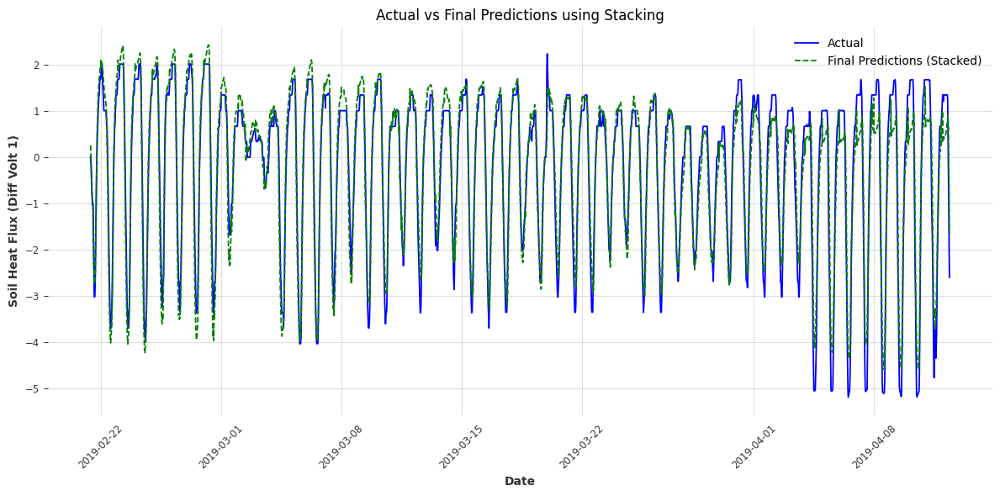

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from darts import TimeSeries
from darts.models import TCNModel

# Function to load data
def load_data(train_file, val_file):
    train_df = pd.read_csv(train_file)
    val_df = pd.read_csv(val_file)
    
    # Convert 'DateTime' column to datetime and set as index
    for df in [train_df, val_df]:
        df['DateTime'] = pd.to_datetime(df['DateTime'])
        df.set_index('DateTime', inplace=True)
    
    return train_df, val_df

# Load CSV data files (adjust paths as needed)
train_file = '/kaggle/input/forecastingtcn/train_transformed_10.csv'
val_file = '/kaggle/input/forecastingtcn/val_transformed_10.csv'
train_df, val_df = load_data(train_file, val_file)

# Select features and target
features = ['Month', 'VolSWC_20cm', 'Hour', 'SoilTemp_10cm', 'VolSWC_10cm',
            'SoilTemp_40cm', 'NET_Radiation', 'SoilTemp_20cm']
target = 'SoilHeatFlux_DiffVolt1'

X_train = train_df[features].values
y_train = train_df[target].values
X_val = val_df[features].values
y_val = val_df[target].values

# Normalize the data for ANN
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Build and train ANN model
ann_model = Sequential()
ann_model.add(Dense(64, activation='relu', input_dim=X_train_scaled.shape[1]))
ann_model.add(Dense(32, activation='relu'))
ann_model.add(Dense(1, activation='linear'))  # Output for regression
ann_model.compile(optimizer='adam', loss='mse')
ann_model.fit(X_train_scaled, y_train, validation_data=(X_val_scaled, y_val), epochs=100, batch_size=32, verbose=1)

# Get ANN predictions for the training and validation sets
ann_train_predictions = ann_model.predict(X_train_scaled).flatten()
ann_val_predictions = ann_model.predict(X_val_scaled).flatten()

# Prepare TimeSeries objects for TCN including ANN predictions
train_df['ANN_Predictions'] = ann_train_predictions
val_df['ANN_Predictions'] = ann_val_predictions

train_series_tcn = TimeSeries.from_dataframe(train_df[features + [target, 'ANN_Predictions']], freq='10T')
val_series_tcn = TimeSeries.from_dataframe(val_df[features + [target, 'ANN_Predictions']], freq='10T')

# Initialize and train TCN model with ANN predictions as input
tcn_model = TCNModel(
    input_chunk_length=60,
    output_chunk_length=1,
    n_epochs=10,
    dropout=0.05,
    dilation_base=3,
    weight_norm=True,
    kernel_size=5,
    num_filters=16,
    random_state=0
)

# Fit the TCN model using the training series with ANN predictions
tcn_model.fit(series=train_series_tcn[target], val_series=val_series_tcn[target], verbose=True)

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(y_val), series=train_series_tcn[target])
tcn_predictions_np = tcn_predictions.values()

# Stack predictions
stack_X = np.column_stack((ann_val_predictions, tcn_predictions_np.flatten()))
stack_y = y_val  # Actual target values

# Train a simple linear regression model on the stacked predictions
meta_model = LinearRegression()
meta_model.fit(stack_X, stack_y)

# Predict using the meta-model
final_predictions = meta_model.predict(stack_X)

# Calculate metrics
mae = mean_absolute_error(y_val, final_predictions)
mse = mean_squared_error(y_val, final_predictions)
r2 = r2_score(y_val, final_predictions)

# Print the metrics
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'R-squared (R²): {r2:.4f}')

# Plot actual vs final predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, y_val, label='Actual', color='blue')
plt.plot(val_df.index, final_predictions, label='Final Predictions (Stacked)', color='green', linestyle='--')
plt.title('Actual vs Final Predictions using Stacking')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Predicting: |          | 0/? [00:00<?, ?it/s]

135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


Predicting: |          | 0/? [00:00<?, ?it/s]

Final Future Predictions Range: -2.5858365729162984 3.0858872038670118


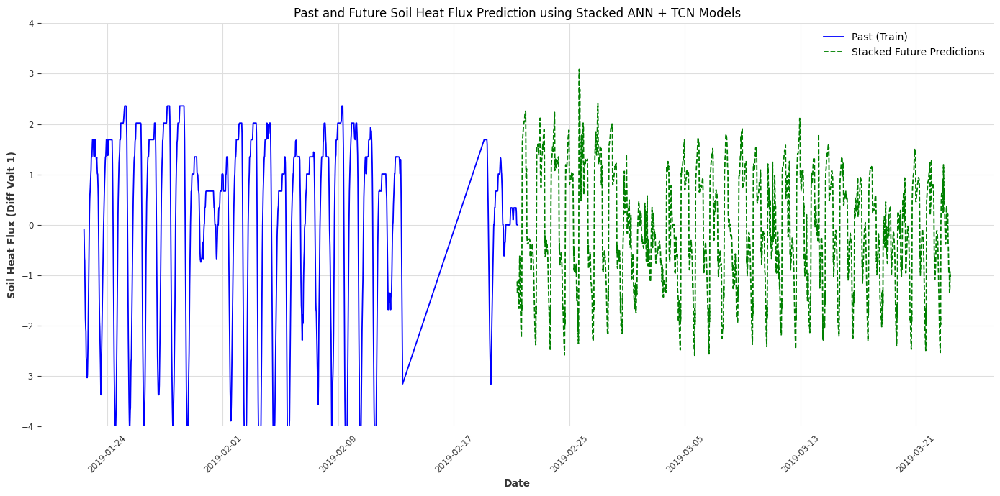

In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator
from sklearn.linear_model import LinearRegression

# Ensure the 'DateTime' column in train_df is a DateTimeIndex
if not isinstance(train_df.index, pd.DatetimeIndex):
    train_df['DateTime'] = pd.to_datetime(train_df['DateTime'])
    train_df.set_index('DateTime', inplace=True)

# Number of future steps to predict
n_future_steps = 144 * 30  

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Get ANN predictions (ensure the correct shape)
ann_predictions = ann_model.predict(X_val[:n_future_steps]).flatten()  # Flatten if needed

# Create a stacked dataset for training the meta-model
stacked_X = np.column_stack((ann_predictions, tcn_predictions_np.flatten()))
stacked_y = y_val[:n_future_steps]  # Use actual target values for training

# Train the meta-model (Linear Regression)
meta_model = LinearRegression()
meta_model.fit(stacked_X, stacked_y)

# Make predictions using the meta-model for future data
future_ann_predictions = ann_model.predict(X_val[:n_future_steps]).flatten()  # Use same input structure
future_tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target]).values().flatten()

# Stack future predictions for meta-model
stacked_future_X = np.column_stack((future_ann_predictions, future_tcn_predictions))
final_future_predictions = meta_model.predict(stacked_future_X)

# Generate future time index based on the last datetime in train_df
last_date = train_df.index[-1]
future_dates = pd.date_range(last_date, periods=n_future_steps + 1, freq='10min')[1:]

# Check predictions range
print("Final Future Predictions Range:", final_future_predictions.min(), final_future_predictions.max())

# Plot past values (from training set) in blue and combined future predictions in green
plt.figure(figsize=(14, 7))

# Plot past values
plt.plot(train_df.index[-n_past:], train_df[target][-n_past:], color='blue', label='Past (Train)')

# Plot combined future predictions
plt.plot(future_dates, final_future_predictions, label='Stacked Future Predictions', color='green', linestyle='--')

plt.title('Past and Future Soil Heat Flux Prediction using Stacked ANN + TCN Models')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')

# Set legend location to the top right corner
plt.legend(loc='upper right')

# Format the x-axis to show the date and time
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Adjust x-axis ticks and limits
plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=60))  # Tick every hour
plt.gca().xaxis.set_major_locator(MaxNLocator(nbins=10, integer=True))
plt.xticks(rotation=45)

 
plt.ylim(-4,4)

plt.tight_layout()
plt.show()

In [35]:
import pandas as pd

# Create a DataFrame for future predictions
future_results = pd.DataFrame({
    'DateTime': future_dates,
    'Predicted Soil Heat Flux (Diff Volt 1)': final_future_predictions
})

# Specify the file name for saving
output_file = 'future_forecasting_predictions10.xlsx'

# Save the DataFrame to an Excel file
future_results.to_excel(output_file, index=False)

print(f"Future forecasting results saved to {output_file}")

Future forecasting results saved to future_forecasting_predictions10.xlsx


/opt/conda/lib/python3.10/site-packages/torch/nn/utils/weight_norm.py:134: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Mean Absolute Error (MAE): 0.3218
Mean Squared Error (MSE): 0.2099
R-squared (R²): 0.9284


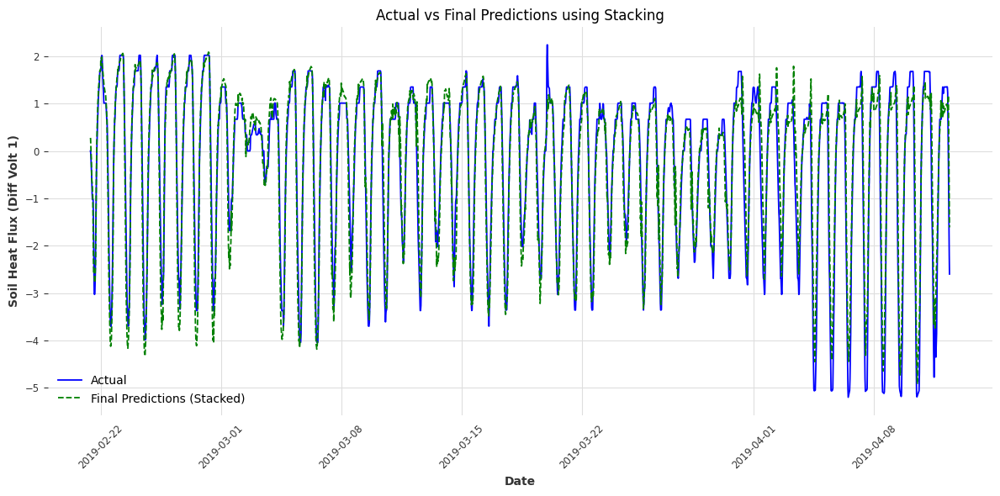

In [17]:

# Initialize and train TCN model with ANN predictions as input
tcn_model = TCNModel(
    input_chunk_length=60,
    output_chunk_length=1,
    n_epochs=25,
    dropout=0.05,
    dilation_base=3,
    weight_norm=True,
    kernel_size=5,
    num_filters=16,
    random_state=0
)

# Fit the TCN model using the training series with ANN predictions
tcn_model.fit(series=train_series_tcn[target], val_series=val_series_tcn[target], verbose=True)

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(y_val), series=train_series_tcn[target])
tcn_predictions_np = tcn_predictions.values()

# Stack predictions
stack_X = np.column_stack((ann_val_predictions, tcn_predictions_np.flatten()))
stack_y = y_val  # Actual target values

# Train a simple linear regression model on the stacked predictions
meta_model = LinearRegression()
meta_model.fit(stack_X, stack_y)

# Predict using the meta-model
final_predictions = meta_model.predict(stack_X)

# Calculate metrics
mae = mean_absolute_error(y_val, final_predictions)
mse = mean_squared_error(y_val, final_predictions)
r2 = r2_score(y_val, final_predictions)

# Print the metrics
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'R-squared (R²): {r2:.4f}')

# Plot actual vs final predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, y_val, label='Actual', color='blue')
plt.plot(val_df.index, final_predictions, label='Final Predictions (Stacked)', color='green', linestyle='--')
plt.title('Actual vs Final Predictions using Stacking')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [1]:
!pip install darts

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.2/52.2 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.8/165.8 kB 7.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 917.3/917.3 kB 23.9 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 58.6 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 314.7/314.7 kB 23.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.7/196.7 kB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.2/278.2 kB 21.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.3/135.3 kB 11.7 MB/s eta 0

Epoch 1/100


/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1051/1051 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.5958 - val_loss: 0.5812
Epoch 2/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0759 - val_loss: 0.5017
Epoch 3/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0559 - val_loss: 0.3765
Epoch 4/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.0483 - val_loss: 0.3556
Epoch 5/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0437 - val_loss: 0.4382
Epoch 6/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0422 - val_loss: 0.3324
Epoch 7/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0382 - val_loss: 0.3130
Epoch 8/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0338 - val_loss: 0.3520
Epoch 9/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0322 - val_loss: 0.2852
Epoch 10/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0327 - val_loss: 0.3355
Epoch 11/100
1051/1051 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0312 - val_loss: 0.2865
Epoch 12/100
1051/1051 ━━━━━━━━

/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/torch/nn/utils/weight_norm.py:134: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Mean Absolute Error (MAE): 0.2861
Mean Squared Error (MSE): 0.1623
R-squared (R²): 0.9447


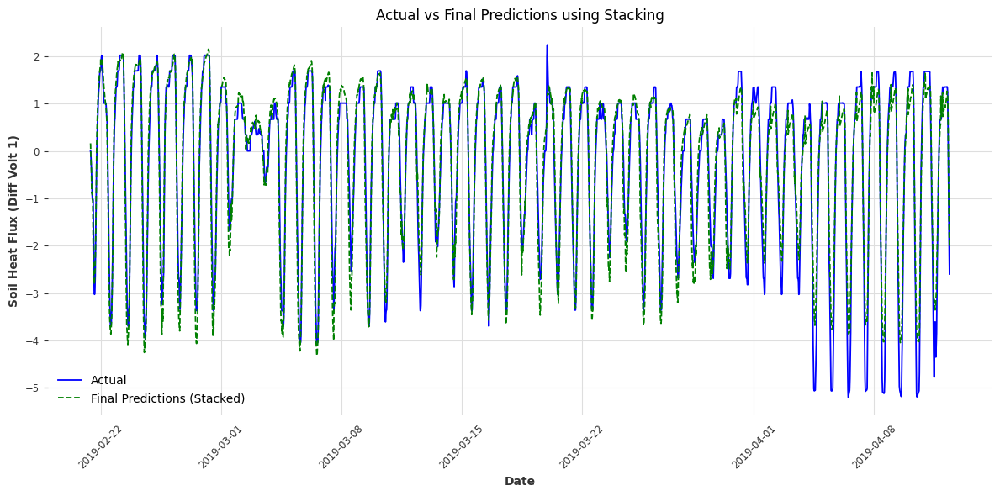

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from darts import TimeSeries
from darts.models import TCNModel

# Function to load data
def load_data(train_file, val_file):
    train_df = pd.read_csv(train_file)
    val_df = pd.read_csv(val_file)
    
    # Convert 'DateTime' column to datetime and set as index
    for df in [train_df, val_df]:
        df['DateTime'] = pd.to_datetime(df['DateTime'])
        df.set_index('DateTime', inplace=True)
    
    return train_df, val_df

# Load CSV data files (adjust paths as needed)
train_file = '/kaggle/input/forecastingtcn/train_transformed_10.csv'
val_file = '/kaggle/input/forecastingtcn/val_transformed_10.csv'
train_df, val_df = load_data(train_file, val_file)

# Select features and target
features = ['Month', 'VolSWC_20cm', 'Hour', 'SoilTemp_10cm', 'VolSWC_10cm',
            'SoilTemp_40cm', 'NET_Radiation', 'SoilTemp_20cm']
target = 'SoilHeatFlux_DiffVolt1'

X_train = train_df[features].values
y_train = train_df[target].values
X_val = val_df[features].values
y_val = val_df[target].values

# Normalize the data for ANN
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Build and train ANN model
ann_model = Sequential()
ann_model.add(Dense(64, activation='relu', input_dim=X_train_scaled.shape[1]))
ann_model.add(Dense(32, activation='relu'))
ann_model.add(Dense(1, activation='linear'))  # Output for regression
ann_model.compile(optimizer='adam', loss='mse')
ann_model.fit(X_train_scaled, y_train, validation_data=(X_val_scaled, y_val), epochs=100, batch_size=32, verbose=1)

# Get ANN predictions for the training and validation sets
ann_train_predictions = ann_model.predict(X_train_scaled).flatten()
ann_val_predictions = ann_model.predict(X_val_scaled).flatten()

# Prepare TimeSeries objects for TCN including ANN predictions
train_df['ANN_Predictions'] = ann_train_predictions
val_df['ANN_Predictions'] = ann_val_predictions

train_series_tcn = TimeSeries.from_dataframe(train_df[features + [target, 'ANN_Predictions']], freq='10T')
val_series_tcn = TimeSeries.from_dataframe(val_df[features + [target, 'ANN_Predictions']], freq='10T')

# Initialize and train TCN model with ANN predictions as input
tcn_model = TCNModel(
    input_chunk_length=60,
    output_chunk_length=1,
    n_epochs=50,
    dropout=0.05,
    dilation_base=3,
    weight_norm=True,
    kernel_size=5,
    num_filters=16,
    random_state=0
)

# Fit the TCN model using the training series with ANN predictions
tcn_model.fit(series=train_series_tcn[target], val_series=val_series_tcn[target], verbose=True)

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(y_val), series=train_series_tcn[target])
tcn_predictions_np = tcn_predictions.values()

# Stack predictions
stack_X = np.column_stack((ann_val_predictions, tcn_predictions_np.flatten()))
stack_y = y_val  # Actual target values

# Train a simple linear regression model on the stacked predictions
meta_model = LinearRegression()
meta_model.fit(stack_X, stack_y)

# Predict using the meta-model
final_predictions = meta_model.predict(stack_X)

# Calculate metrics
mae = mean_absolute_error(y_val, final_predictions)
mse = mean_squared_error(y_val, final_predictions)
r2 = r2_score(y_val, final_predictions)

# Print the metrics
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'R-squared (R²): {r2:.4f}')

# Plot actual vs final predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, y_val, label='Actual', color='blue')
plt.plot(val_df.index, final_predictions, label='Final Predictions (Stacked)', color='green', linestyle='--')
plt.title('Actual vs Final Predictions using Stacking')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


226/226 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)


Predicting: |          | 0/? [00:00<?, ?it/s]

Test Mean Absolute Error (MAE): 0.4311
Test Mean Squared Error (MSE): 0.4280
Test R-squared (R²): 0.9123


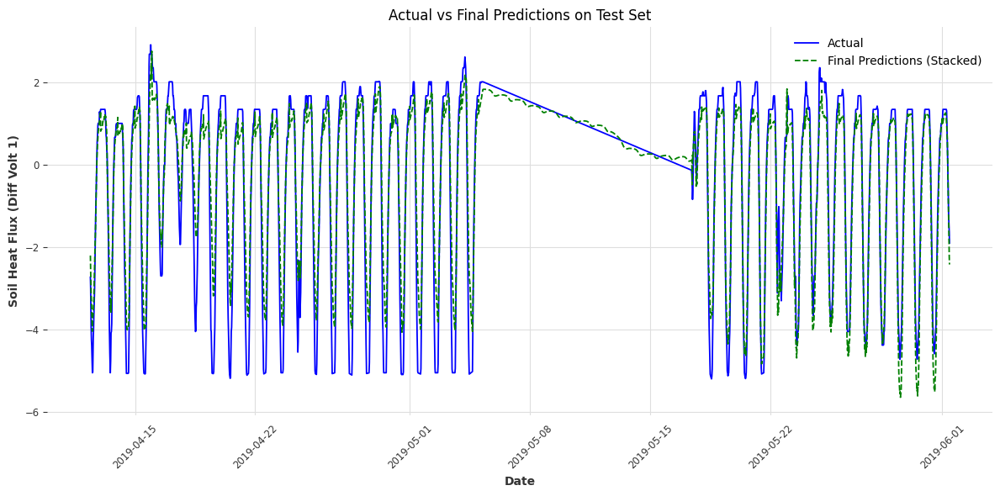

In [13]:
# Load test data function (similar to load_data)
def load_test_data(test_file):
    test_df = pd.read_csv(test_file)
    test_df['DateTime'] = pd.to_datetime(test_df['DateTime'])
    test_df.set_index('DateTime', inplace=True)
    return test_df

# Load CSV data file for test set (adjust path as needed)
test_file = '/kaggle/input/forecastingtcn/test_transformed_10.csv'
test_df = load_test_data(test_file)

# Select features and target for test set
X_test = test_df[features].values
y_test = test_df[target].values

# Normalize the data for ANN using previously fitted scaler
X_test_scaled = scaler.transform(X_test)

# Get ANN predictions for the test set
ann_test_predictions = ann_model.predict(X_test_scaled).flatten()

# Prepare TimeSeries object for TCN including ANN predictions on test set
test_df['ANN_Predictions'] = ann_test_predictions
test_series_tcn = TimeSeries.from_dataframe(test_df[features + [target, 'ANN_Predictions']], freq='10T')

# Get TCN predictions using ANN predictions as input on test set
tcn_predictions_test = tcn_model.predict(n=len(y_test), series=test_series_tcn[target])
tcn_predictions_np_test = tcn_predictions_test.values()

# Stack predictions for meta-model on test set
stack_X_test = np.column_stack((ann_test_predictions, tcn_predictions_np_test.flatten()))
stack_y_test = y_test  # Actual target values
# Predict using the meta-model on test set
final_predictions_test = meta_model.predict(stack_X_test)

# Calculate metrics for test set
mae_test = mean_absolute_error(y_test, final_predictions_test)
mse_test = mean_squared_error(y_test, final_predictions_test)
r2_test = r2_score(y_test, final_predictions_test)

# Print metrics for test set
print(f'Test Mean Absolute Error (MAE): {mae_test:.4f}')
print(f'Test Mean Squared Error (MSE): {mse_test:.4f}')
print(f'Test R-squared (R²): {r2_test:.4f}')

# Plot actual vs final predictions for test set
plt.figure(figsize=(12, 6))
plt.plot(test_df.index, y_test, label='Actual', color='blue')
plt.plot(test_df.index, final_predictions_test, label='Final Predictions (Stacked)', color='green', linestyle='--')
plt.title('Actual vs Final Predictions on Test Set')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [14]:
# Select relevant columns
target = 'SoilHeatFlux_DiffVolt1'  # Example target column
features = ['Month', 'VolSWC_20cm', 'Hour', 'SoilTemp_10cm', 'VolSWC_10cm',
            'SoilTemp_40cm', 'NET_Radiation', 'SoilTemp_20cm']

# Prepare TimeSeries objects
train_series = TimeSeries.from_dataframe(train_df[features + [target]], freq='10T')
val_series = TimeSeries.from_dataframe(val_df[features + [target]], freq='10T')
test_series = TimeSeries.from_dataframe(test_df[features + [target]], freq='10T')


/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)


Predicting: |          | 0/? [00:00<?, ?it/s]

203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


Predicting: |          | 0/? [00:00<?, ?it/s]

Final Future Predictions Range: -5.570624322905864 3.1115057754364894


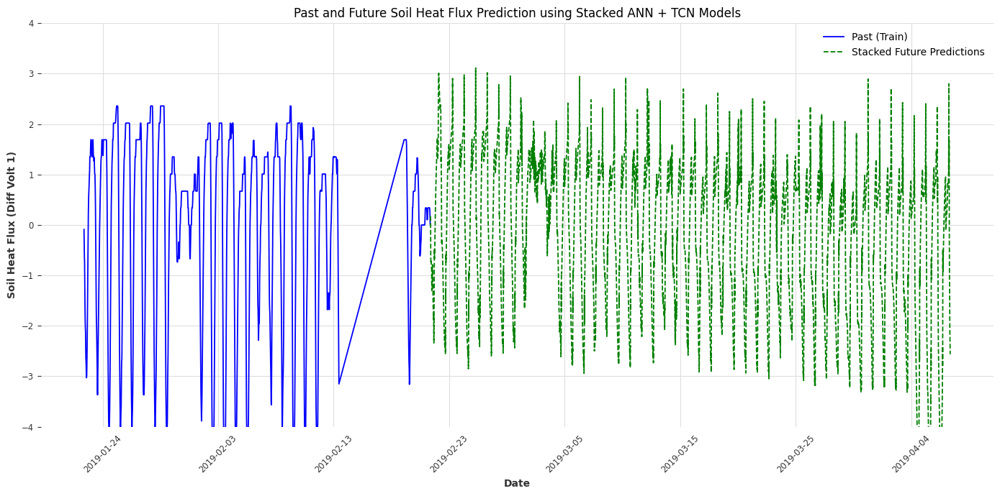

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator
from sklearn.linear_model import LinearRegression

# Ensure the 'DateTime' column in train_df is a DateTimeIndex
if not isinstance(train_df.index, pd.DatetimeIndex):
    train_df['DateTime'] = pd.to_datetime(train_df['DateTime'])
    train_df.set_index('DateTime', inplace=True)

# Define the number of past observations to plot
n_past = 144*30  # Adjust this value as needed, e.g., 144 for 24 hours of 10-minute data

# Number of future steps to predict
n_future_steps = 144 * 45  # For example, 30 days of 10-minute intervals

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Get ANN predictions (ensure the correct shape)
ann_predictions = ann_model.predict(X_val[:n_future_steps]).flatten()  # Flatten if needed

# Create a stacked dataset for training the meta-model
stacked_X = np.column_stack((ann_predictions, tcn_predictions_np.flatten()))
stacked_y = y_val[:n_future_steps]  # Use actual target values for training

# Train the meta-model (Linear Regression)
meta_model = LinearRegression()
meta_model.fit(stacked_X, stacked_y)

# Make predictions using the meta-model for future data
future_ann_predictions = ann_model.predict(X_val[:n_future_steps]).flatten()  # Use same input structure
future_tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target]).values().flatten()

# Stack future predictions for meta-model
stacked_future_X = np.column_stack((future_ann_predictions, future_tcn_predictions))
final_future_predictions = meta_model.predict(stacked_future_X)

# Generate future time index based on the last datetime in train_df
last_date = train_df.index[-1]
future_dates = pd.date_range(last_date, periods=n_future_steps + 1, freq='10min')[1:]

# Check predictions range
print("Final Future Predictions Range:", final_future_predictions.min(), final_future_predictions.max())

# Plot past values (from training set) in blue and combined future predictions in green
plt.figure(figsize=(14, 7))

# Plot past values
plt.plot(train_df.index[-n_past:], train_df[target][-n_past:], color='blue', label='Past (Train)')

# Plot combined future predictions
plt.plot(future_dates, final_future_predictions, label='Stacked Future Predictions', color='green', linestyle='--')

plt.title('Past and Future Soil Heat Flux Prediction using Stacked ANN + TCN Models')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')

# Set legend location to the top right corner
plt.legend(loc='upper right')

# Format the x-axis to show the date and time
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Adjust x-axis ticks and limits
plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=60))  # Tick every hour
plt.gca().xaxis.set_major_locator(MaxNLocator(nbins=10, integer=True))
plt.xticks(rotation=45)

plt.ylim(-4, 4)

plt.tight_layout()
plt.show()

Predicting: |          | 0/? [00:00<?, ?it/s]

203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


Predicting: |          | 0/? [00:00<?, ?it/s]

Final Future Predictions Range: -3.106095153115525 2.164160482311471


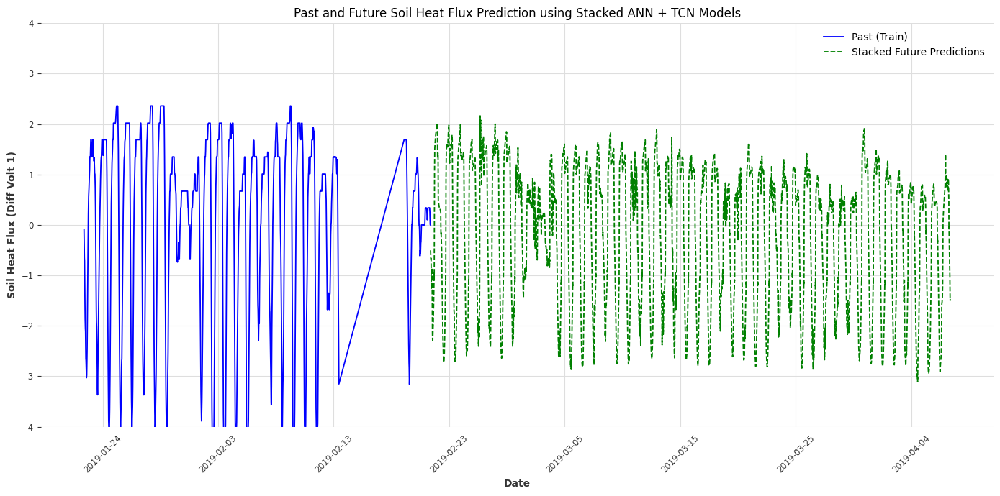

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator
from sklearn.linear_model import LinearRegression

# Ensure the 'DateTime' column in train_df is a DateTimeIndex
if not isinstance(train_df.index, pd.DatetimeIndex):
    train_df['DateTime'] = pd.to_datetime(train_df['DateTime'])
    train_df.set_index('DateTime', inplace=True)

# Define the number of past observations to plot
n_past = 144*30  # Adjust this value as needed, e.g., 144 for 24 hours of 10-minute data

# Number of future steps to predict
n_future_steps = 144 * 45  # For example, 30 days of 10-minute intervals

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Get ANN predictions (ensure the correct shape)
ann_predictions = ann_model.predict(X_val[:n_future_steps]).flatten()  # Flatten if needed

# Create a stacked dataset for training the meta-model
stacked_X = np.column_stack((ann_predictions, tcn_predictions_np.flatten()))
stacked_y = y_val[:n_future_steps]  # Use actual target values for training

# Train the meta-model (Linear Regression)
meta_model = LinearRegression()
meta_model.fit(stacked_X, stacked_y)

# Make predictions using the meta-model for future data
future_ann_predictions = ann_model.predict(X_val[:n_future_steps]).flatten()  # Use same input structure
future_tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target]).values().flatten()

# Stack future predictions for meta-model
stacked_future_X = np.column_stack((future_ann_predictions, future_tcn_predictions))
final_future_predictions = meta_model.predict(stacked_future_X)

# Generate future time index based on the last datetime in train_df
last_date = train_df.index[-1]
future_dates = pd.date_range(last_date, periods=n_future_steps + 1, freq='10min')[1:]

# Check predictions range
print("Final Future Predictions Range:", final_future_predictions.min(), final_future_predictions.max())

# Plot past values (from training set) in blue and combined future predictions in green
plt.figure(figsize=(14, 7))

# Plot past values
plt.plot(train_df.index[-n_past:], train_df[target][-n_past:], color='blue', label='Past (Train)')

# Plot combined future predictions
plt.plot(future_dates, final_future_predictions, label='Stacked Future Predictions', color='green', linestyle='--')

plt.title('Past and Future Soil Heat Flux Prediction using Stacked ANN + TCN Models')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')

# Set legend location to the top right corner
plt.legend(loc='upper right')

# Format the x-axis to show the date and time
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Adjust x-axis ticks and limits
plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=60))  # Tick every hour
plt.gca().xaxis.set_major_locator(MaxNLocator(nbins=10, integer=True))
plt.xticks(rotation=45)

plt.ylim(-4, 4)

plt.tight_layout()
plt.show()

In [16]:
import joblib
# Save the trained meta-model
model_filename = 'meta_model50ensemble.pkl'  # Specify the filename
joblib.dump(meta_model, model_filename)
print(f'Meta-model saved to {model_filename}')

Meta-model saved to meta_model50ensemble.pkl


In [17]:
import pandas as pd

# Create a DataFrame for future predictions
future_results = pd.DataFrame({
    'DateTime': future_dates,
    'Predicted Soil Heat Flux (Diff Volt 1)': final_future_predictions
})

# Specify the file name for saving
output_file = 'future_forecasting_predictionsEnsemble50.xlsx'

# Save the DataFrame to an Excel file
future_results.to_excel(output_file, index=False)

print(f"Future forecasting results saved to {output_file}")

Future forecasting results saved to future_forecasting_predictionsEnsemble50.xlsx


In [18]:
import pandas as pd

# Create a DataFrame for future predictions
future_results = pd.DataFrame({
    'DateTime': future_dates,
    'Predicted Soil Heat Flux (Diff Volt 1)': final_future_predictions
})

# Specify the file name for saving
output_file = 'future_forecasting_predictions50Ensembletest.xlsx'

# Save the DataFrame to an Excel file
future_results.to_excel(output_file, index=False)

print(f"Future forecasting results saved to {output_file}")

Future forecasting results saved to future_forecasting_predictions50Ensembletest.xlsx


Predicting: |          | 0/? [00:00<?, ?it/s]

203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


Predicting: |          | 0/? [00:00<?, ?it/s]

Final Future Predictions Range: -3.106095153115525 2.164160482311471


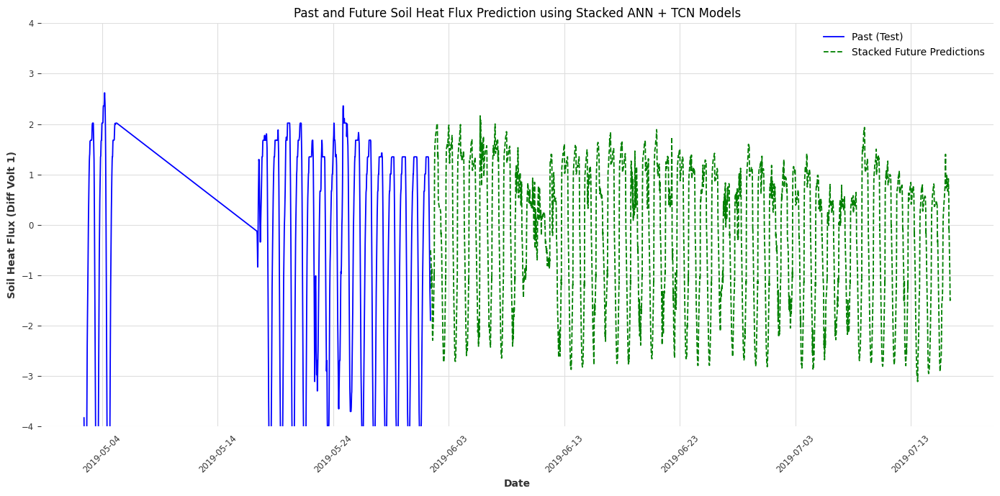

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator
from sklearn.linear_model import LinearRegression

# Ensure the 'DateTime' column in train_df is a DateTimeIndex
if not isinstance(train_df.index, pd.DatetimeIndex):
    train_df['DateTime'] = pd.to_datetime(train_df['DateTime'])
    train_df.set_index('DateTime', inplace=True)

# Define the number of past observations to plot
n_past = 144*30  # Adjust this value as needed, e.g., 144 for 24 hours of 10-minute data

# Number of future steps to predict
n_future_steps = 144 * 45  # For example, 30 days of 10-minute intervals

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Get ANN predictions (ensure the correct shape)
ann_predictions = ann_model.predict(X_val[:n_future_steps]).flatten()  # Flatten if needed

# Create a stacked dataset for training the meta-model
stacked_X = np.column_stack((ann_predictions, tcn_predictions_np.flatten()))
stacked_y = y_val[:n_future_steps]  # Use actual target values for training

# Train the meta-model (Linear Regression)
meta_model = LinearRegression()
meta_model.fit(stacked_X, stacked_y)

# Make predictions using the meta-model for future data
future_ann_predictions = ann_model.predict(X_val[:n_future_steps]).flatten()  # Use same input structure
future_tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target]).values().flatten()

# Stack future predictions for meta-model
stacked_future_X = np.column_stack((future_ann_predictions, future_tcn_predictions))
final_future_predictions = meta_model.predict(stacked_future_X)

# Generate future time index based on the last datetime in train_df
last_date = test_df.index[-1]
future_dates = pd.date_range(last_date, periods=n_future_steps + 1, freq='10min')[1:]

# Check predictions range
print("Final Future Predictions Range:", final_future_predictions.min(), final_future_predictions.max())

# Plot past values (from training set) in blue and combined future predictions in green
plt.figure(figsize=(14, 7))

# Plot past values
plt.plot(test_df.index[-n_past:], test_df[target][-n_past:], color='blue', label='Past (Test)')

# Plot combined future predictions
plt.plot(future_dates, final_future_predictions, label='Stacked Future Predictions', color='green', linestyle='--')

plt.title('Past and Future Soil Heat Flux Prediction using Stacked ANN + TCN Models')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')

# Set legend location to the top right corner
plt.legend(loc='upper right')

# Format the x-axis to show the date and time
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Adjust x-axis ticks and limits
plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=60))  # Tick every hour
plt.gca().xaxis.set_major_locator(MaxNLocator(nbins=10, integer=True))
plt.xticks(rotation=45)

plt.ylim(-4, 4)

plt.tight_layout()
plt.show()

In [20]:
import pandas as pd

# Create a DataFrame for future predictions
future_results = pd.DataFrame({
    'DateTime': future_dates,
    'Predicted Soil Heat Flux (Diff Volt 1)': final_future_predictions
})

# Specify the file name for saving
output_file = 'futureForecastingEnsemble.xlsx'

# Save the DataFrame to an Excel file
future_results.to_excel(output_file, index=False)

print(f"Future forecasting results saved to {output_file}")

Future forecasting results saved to futureForecastingEnsemble.xlsx


/opt/conda/lib/python3.10/site-packages/torch/nn/utils/weight_norm.py:134: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Mean Absolute Error (MAE): 0.2935
Mean Squared Error (MSE): 0.1559
R-squared (R²): 0.9469


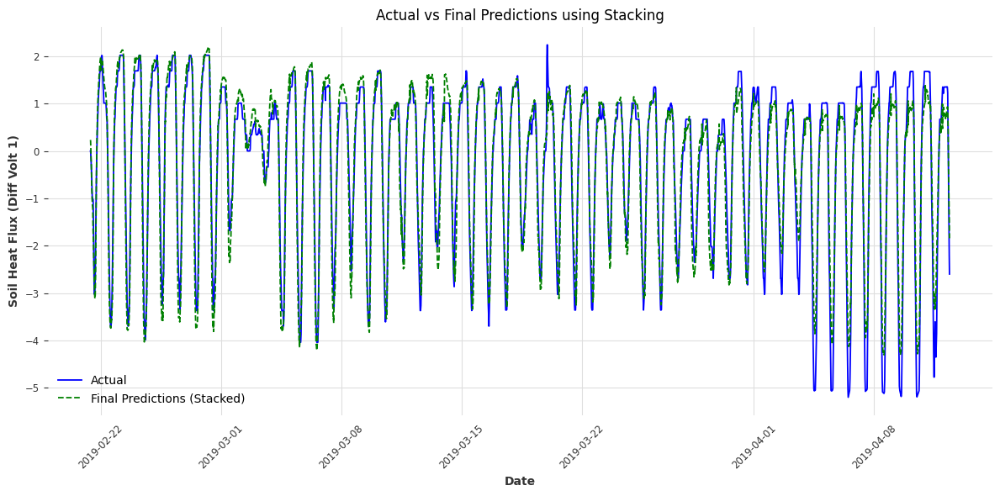

In [10]:

# Initialize and train TCN model with ANN predictions as input
tcn_model = TCNModel(
    input_chunk_length=60,
    output_chunk_length=1,
    n_epochs=65,
    dropout=0.05,
    dilation_base=3,
    weight_norm=True,
    kernel_size=5,
    num_filters=16,
    random_state=0
)

# Fit the TCN model using the training series with ANN predictions
tcn_model.fit(series=train_series_tcn[target], val_series=val_series_tcn[target], verbose=True)

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(y_val), series=train_series_tcn[target])
tcn_predictions_np = tcn_predictions.values()

# Stack predictions
stack_X = np.column_stack((ann_val_predictions, tcn_predictions_np.flatten()))
stack_y = y_val  # Actual target values

# Train a simple linear regression model on the stacked predictions
meta_model = LinearRegression()
meta_model.fit(stack_X, stack_y)

# Predict using the meta-model
final_predictions = meta_model.predict(stack_X)

# Calculate metrics
mae = mean_absolute_error(y_val, final_predictions)
mse = mean_squared_error(y_val, final_predictions)
r2 = r2_score(y_val, final_predictions)

# Print the metrics
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'R-squared (R²): {r2:.4f}')

# Plot actual vs final predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, y_val, label='Actual', color='blue')
plt.plot(val_df.index, final_predictions, label='Final Predictions (Stacked)', color='green', linestyle='--')
plt.title('Actual vs Final Predictions using Stacking')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


226/226 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)


Predicting: |          | 0/? [00:00<?, ?it/s]

Test Mean Absolute Error (MAE): 0.4920
Test Mean Squared Error (MSE): 0.4579
Test R-squared (R²): 0.9062


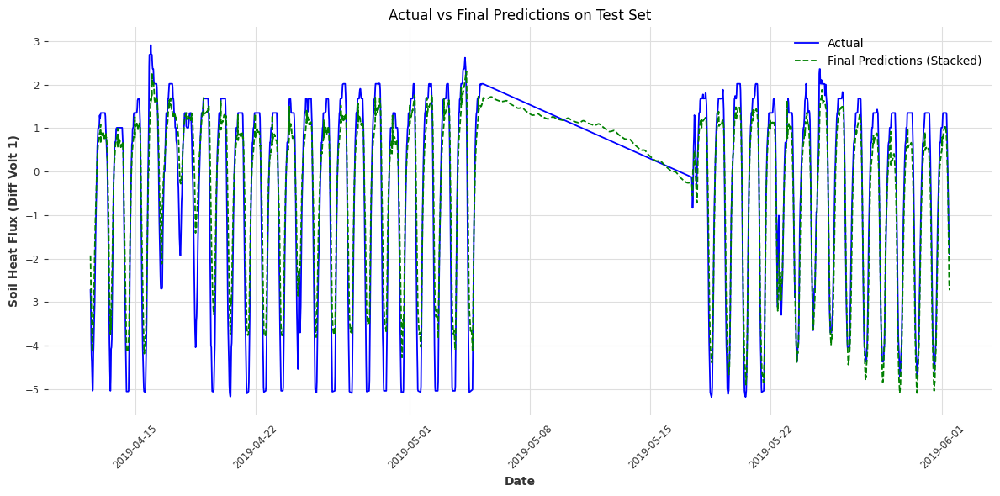

In [11]:
# Load test data function (similar to load_data)
def load_test_data(test_file):
    test_df = pd.read_csv(test_file)
    test_df['DateTime'] = pd.to_datetime(test_df['DateTime'])
    test_df.set_index('DateTime', inplace=True)
    return test_df

# Load CSV data file for test set (adjust path as needed)
test_file = '/kaggle/input/forecastingtcn/test_transformed_10.csv'
test_df = load_test_data(test_file)

# Select features and target for test set
X_test = test_df[features].values
y_test = test_df[target].values

# Normalize the data for ANN using previously fitted scaler
X_test_scaled = scaler.transform(X_test)

# Get ANN predictions for the test set
ann_test_predictions = ann_model.predict(X_test_scaled).flatten()

# Prepare TimeSeries object for TCN including ANN predictions on test set
test_df['ANN_Predictions'] = ann_test_predictions
test_series_tcn = TimeSeries.from_dataframe(test_df[features + [target, 'ANN_Predictions']], freq='10T')

# Get TCN predictions using ANN predictions as input on test set
tcn_predictions_test = tcn_model.predict(n=len(y_test), series=test_series_tcn[target])
tcn_predictions_np_test = tcn_predictions_test.values()

# Stack predictions for meta-model on test set
stack_X_test = np.column_stack((ann_test_predictions, tcn_predictions_np_test.flatten()))
stack_y_test = y_test  # Actual target values
# Predict using the meta-model on test set
final_predictions_test = meta_model.predict(stack_X_test)

# Calculate metrics for test set
mae_test = mean_absolute_error(y_test, final_predictions_test)
mse_test = mean_squared_error(y_test, final_predictions_test)
r2_test = r2_score(y_test, final_predictions_test)

# Print metrics for test set
print(f'Test Mean Absolute Error (MAE): {mae_test:.4f}')
print(f'Test Mean Squared Error (MSE): {mse_test:.4f}')
print(f'Test R-squared (R²): {r2_test:.4f}')

# Plot actual vs final predictions for test set
plt.figure(figsize=(12, 6))
plt.plot(test_df.index, y_test, label='Actual', color='blue')
plt.plot(test_df.index, final_predictions_test, label='Final Predictions (Stacked)', color='green', linestyle='--')
plt.title('Actual vs Final Predictions on Test Set')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [12]:
# Select relevant columns
target = 'SoilHeatFlux_DiffVolt1'  # Example target column
features = ['Month', 'VolSWC_20cm', 'Hour', 'SoilTemp_10cm', 'VolSWC_10cm',
            'SoilTemp_40cm', 'NET_Radiation', 'SoilTemp_20cm']

# Prepare TimeSeries objects
train_series = TimeSeries.from_dataframe(train_df[features + [target]], freq='10T')
val_series = TimeSeries.from_dataframe(val_df[features + [target]], freq='10T')
test_series = TimeSeries.from_dataframe(test_df[features + [target]], freq='10T')


/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)


Predicting: |          | 0/? [00:00<?, ?it/s]

203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


Predicting: |          | 0/? [00:00<?, ?it/s]

Final Future Predictions Range: -5.58933321498988 3.085413127888808


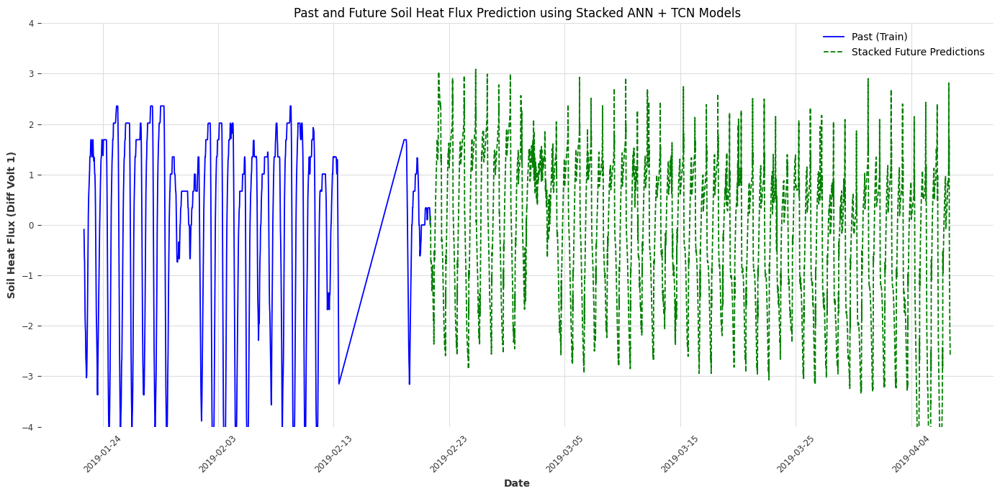

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator
from sklearn.linear_model import LinearRegression

# Ensure the 'DateTime' column in train_df is a DateTimeIndex
if not isinstance(train_df.index, pd.DatetimeIndex):
    train_df['DateTime'] = pd.to_datetime(train_df['DateTime'])
    train_df.set_index('DateTime', inplace=True)

# Define the number of past observations to plot
n_past = 144*30  # Adjust this value as needed, e.g., 144 for 24 hours of 10-minute data

# Number of future steps to predict
n_future_steps = 144 * 45  # For example, 30 days of 10-minute intervals

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Get ANN predictions (ensure the correct shape)
ann_predictions = ann_model.predict(X_val[:n_future_steps]).flatten()  # Flatten if needed

# Create a stacked dataset for training the meta-model
stacked_X = np.column_stack((ann_predictions, tcn_predictions_np.flatten()))
stacked_y = y_val[:n_future_steps]  # Use actual target values for training

# Train the meta-model (Linear Regression)
meta_model = LinearRegression()
meta_model.fit(stacked_X, stacked_y)

# Make predictions using the meta-model for future data
future_ann_predictions = ann_model.predict(X_val[:n_future_steps]).flatten()  # Use same input structure
future_tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target]).values().flatten()

# Stack future predictions for meta-model
stacked_future_X = np.column_stack((future_ann_predictions, future_tcn_predictions))
final_future_predictions = meta_model.predict(stacked_future_X)

# Generate future time index based on the last datetime in train_df
last_date = train_df.index[-1]
future_dates = pd.date_range(last_date, periods=n_future_steps + 1, freq='10min')[1:]

# Check predictions range
print("Final Future Predictions Range:", final_future_predictions.min(), final_future_predictions.max())

# Plot past values (from training set) in blue and combined future predictions in green
plt.figure(figsize=(14, 7))

# Plot past values
plt.plot(train_df.index[-n_past:], train_df[target][-n_past:], color='blue', label='Past (Train)')

# Plot combined future predictions
plt.plot(future_dates, final_future_predictions, label='Stacked Future Predictions', color='green', linestyle='--')

plt.title('Past and Future Soil Heat Flux Prediction using Stacked ANN + TCN Models')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')

# Set legend location to the top right corner
plt.legend(loc='upper right')

# Format the x-axis to show the date and time
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Adjust x-axis ticks and limits
plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=60))  # Tick every hour
plt.gca().xaxis.set_major_locator(MaxNLocator(nbins=10, integer=True))
plt.xticks(rotation=45)

plt.ylim(-4, 4)

plt.tight_layout()
plt.show()

In [14]:
import pandas as pd

# Create a DataFrame for future predictions
future_results = pd.DataFrame({
    'DateTime': future_dates,
    'Predicted Soil Heat Flux (Diff Volt 1)': final_future_predictions
})

# Specify the file name for saving
output_file = 'future_forecasting_predictions65.xlsx'

# Save the DataFrame to an Excel file
future_results.to_excel(output_file, index=False)

print(f"Future forecasting results saved to {output_file}")

Future forecasting results saved to future_forecasting_predictions65.xlsx


In [15]:
import joblib
# Save the trained meta-model
model_filename = 'meta_model65.pkl'  # Specify the filename
joblib.dump(meta_model, model_filename)
print(f'Meta-model saved to {model_filename}')

Meta-model saved to meta_model65.pkl


/opt/conda/lib/python3.10/site-packages/torch/nn/utils/weight_norm.py:134: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Mean Absolute Error (MAE): 0.2948
Mean Squared Error (MSE): 0.1563
R-squared (R²): 0.9467


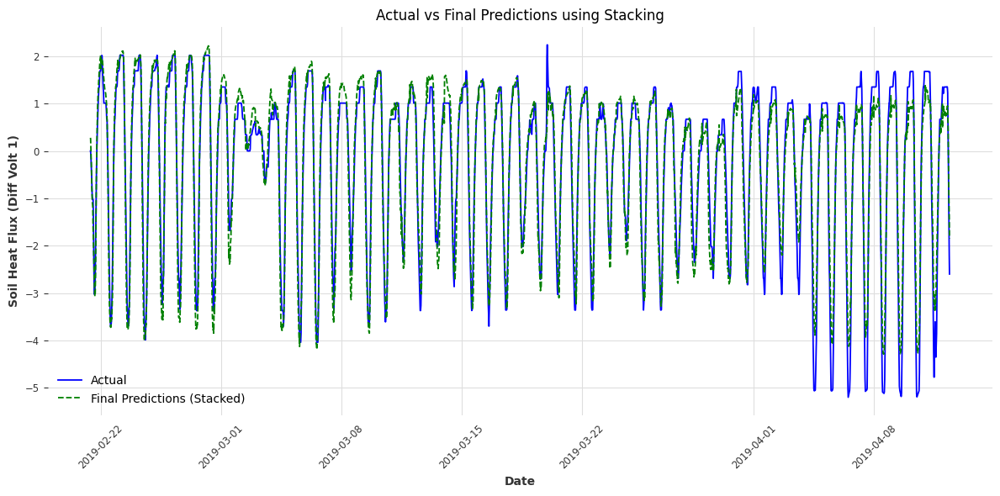

In [16]:

# Initialize and train TCN model with ANN predictions as input
tcn_model = TCNModel(
    input_chunk_length=60,
    output_chunk_length=1,
    n_epochs=25,
    dropout=0.05,
    dilation_base=3,
    weight_norm=True,
    kernel_size=5,
    num_filters=16,
    random_state=0
)

# Fit the TCN model using the training series with ANN predictions
tcn_model.fit(series=train_series_tcn[target], val_series=val_series_tcn[target], verbose=True)

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=len(y_val), series=train_series_tcn[target])
tcn_predictions_np = tcn_predictions.values()

# Stack predictions
stack_X = np.column_stack((ann_val_predictions, tcn_predictions_np.flatten()))
stack_y = y_val  # Actual target values

# Train a simple linear regression model on the stacked predictions
meta_model = LinearRegression()
meta_model.fit(stack_X, stack_y)

# Predict using the meta-model
final_predictions = meta_model.predict(stack_X)

# Calculate metrics
mae = mean_absolute_error(y_val, final_predictions)
mse = mean_squared_error(y_val, final_predictions)
r2 = r2_score(y_val, final_predictions)

# Print the metrics
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'R-squared (R²): {r2:.4f}')

# Plot actual vs final predictions
plt.figure(figsize=(12, 6))
plt.plot(val_df.index, y_val, label='Actual', color='blue')
plt.plot(val_df.index, final_predictions, label='Final Predictions (Stacked)', color='green', linestyle='--')
plt.title('Actual vs Final Predictions using Stacking')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


226/226 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)


Predicting: |          | 0/? [00:00<?, ?it/s]

Test Mean Absolute Error (MAE): 0.4924
Test Mean Squared Error (MSE): 0.4589
Test R-squared (R²): 0.9060


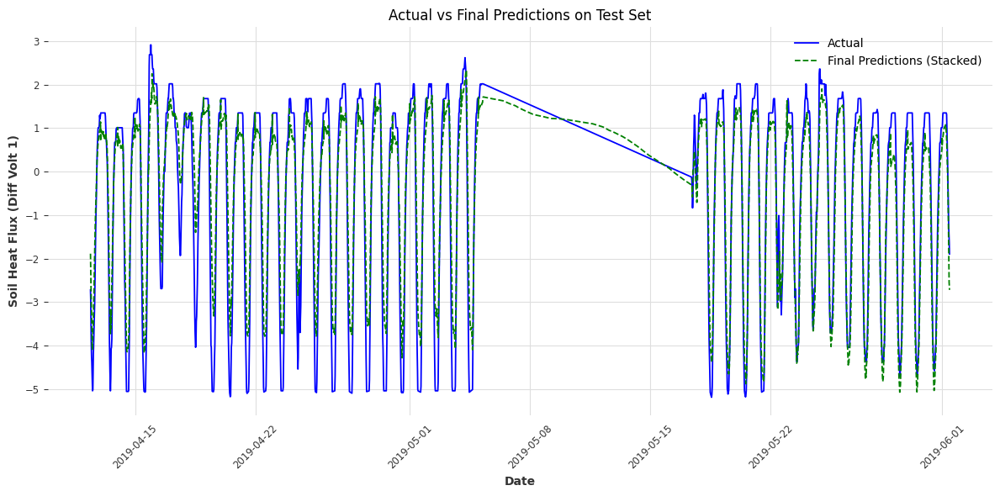

In [17]:
# Load test data function (similar to load_data)
def load_test_data(test_file):
    test_df = pd.read_csv(test_file)
    test_df['DateTime'] = pd.to_datetime(test_df['DateTime'])
    test_df.set_index('DateTime', inplace=True)
    return test_df

# Load CSV data file for test set (adjust path as needed)
test_file = '/kaggle/input/forecastingtcn/test_transformed_10.csv'
test_df = load_test_data(test_file)

# Select features and target for test set
X_test = test_df[features].values
y_test = test_df[target].values

# Normalize the data for ANN using previously fitted scaler
X_test_scaled = scaler.transform(X_test)

# Get ANN predictions for the test set
ann_test_predictions = ann_model.predict(X_test_scaled).flatten()

# Prepare TimeSeries object for TCN including ANN predictions on test set
test_df['ANN_Predictions'] = ann_test_predictions
test_series_tcn = TimeSeries.from_dataframe(test_df[features + [target, 'ANN_Predictions']], freq='10T')

# Get TCN predictions using ANN predictions as input on test set
tcn_predictions_test = tcn_model.predict(n=len(y_test), series=test_series_tcn[target])
tcn_predictions_np_test = tcn_predictions_test.values()

# Stack predictions for meta-model on test set
stack_X_test = np.column_stack((ann_test_predictions, tcn_predictions_np_test.flatten()))
stack_y_test = y_test  # Actual target values
# Predict using the meta-model on test set
final_predictions_test = meta_model.predict(stack_X_test)

# Calculate metrics for test set
mae_test = mean_absolute_error(y_test, final_predictions_test)
mse_test = mean_squared_error(y_test, final_predictions_test)
r2_test = r2_score(y_test, final_predictions_test)

# Print metrics for test set
print(f'Test Mean Absolute Error (MAE): {mae_test:.4f}')
print(f'Test Mean Squared Error (MSE): {mse_test:.4f}')
print(f'Test R-squared (R²): {r2_test:.4f}')

# Plot actual vs final predictions for test set
plt.figure(figsize=(12, 6))
plt.plot(test_df.index, y_test, label='Actual', color='blue')
plt.plot(test_df.index, final_predictions_test, label='Final Predictions (Stacked)', color='green', linestyle='--')
plt.title('Actual vs Final Predictions on Test Set')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [18]:
# Select relevant columns
target = 'SoilHeatFlux_DiffVolt1'  # Example target column
features = ['Month', 'VolSWC_20cm', 'Hour', 'SoilTemp_10cm', 'VolSWC_10cm',
            'SoilTemp_40cm', 'NET_Radiation', 'SoilTemp_20cm']

# Prepare TimeSeries objects
train_series = TimeSeries.from_dataframe(train_df[features + [target]], freq='10T')
val_series = TimeSeries.from_dataframe(val_df[features + [target]], freq='10T')
test_series = TimeSeries.from_dataframe(test_df[features + [target]], freq='10T')


/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)
/opt/conda/lib/python3.10/site-packages/darts/timeseries.py:4804: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_time_index = resampled_time_index.asfreq(freq)


Predicting: |          | 0/? [00:00<?, ?it/s]

203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


Predicting: |          | 0/? [00:00<?, ?it/s]

Final Future Predictions Range: -5.5836793208009405 3.088797787155131


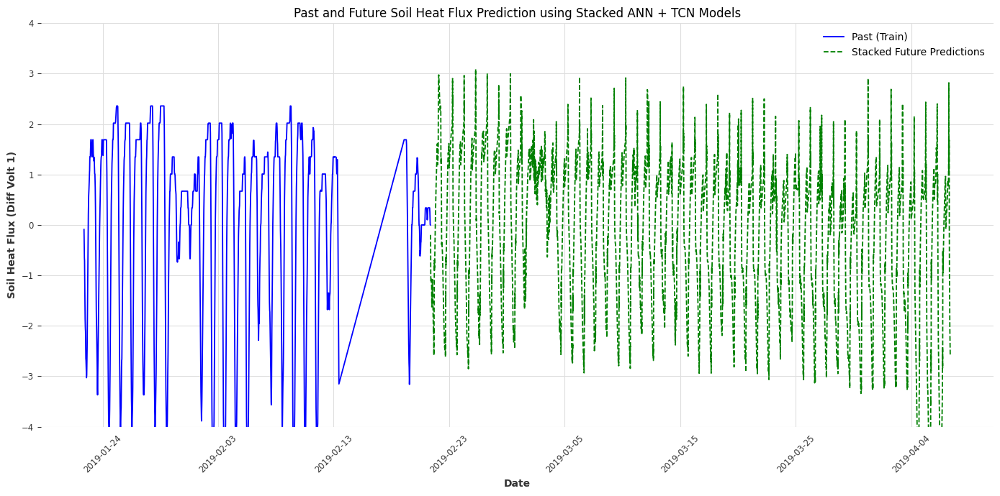

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator
from sklearn.linear_model import LinearRegression

# Ensure the 'DateTime' column in train_df is a DateTimeIndex
if not isinstance(train_df.index, pd.DatetimeIndex):
    train_df['DateTime'] = pd.to_datetime(train_df['DateTime'])
    train_df.set_index('DateTime', inplace=True)

# Define the number of past observations to plot
n_past = 144*30  # Adjust this value as needed, e.g., 144 for 24 hours of 10-minute data

# Number of future steps to predict
n_future_steps = 144 * 45  # For example, 30 days of 10-minute intervals

# Get TCN predictions
tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target])
tcn_predictions_np = tcn_predictions.values()

# Get ANN predictions (ensure the correct shape)
ann_predictions = ann_model.predict(X_val[:n_future_steps]).flatten()  # Flatten if needed

# Create a stacked dataset for training the meta-model
stacked_X = np.column_stack((ann_predictions, tcn_predictions_np.flatten()))
stacked_y = y_val[:n_future_steps]  # Use actual target values for training

# Train the meta-model (Linear Regression)
meta_model = LinearRegression()
meta_model.fit(stacked_X, stacked_y)

# Make predictions using the meta-model for future data
future_ann_predictions = ann_model.predict(X_val[:n_future_steps]).flatten()  # Use same input structure
future_tcn_predictions = tcn_model.predict(n=n_future_steps, series=train_series[target]).values().flatten()

# Stack future predictions for meta-model
stacked_future_X = np.column_stack((future_ann_predictions, future_tcn_predictions))
final_future_predictions = meta_model.predict(stacked_future_X)

# Generate future time index based on the last datetime in train_df
last_date = train_df.index[-1]
future_dates = pd.date_range(last_date, periods=n_future_steps + 1, freq='10min')[1:]

# Check predictions range
print("Final Future Predictions Range:", final_future_predictions.min(), final_future_predictions.max())

# Plot past values (from training set) in blue and combined future predictions in green
plt.figure(figsize=(14, 7))

# Plot past values
plt.plot(train_df.index[-n_past:], train_df[target][-n_past:], color='blue', label='Past (Train)')

# Plot combined future predictions
plt.plot(future_dates, final_future_predictions, label='Stacked Future Predictions', color='green', linestyle='--')

plt.title('Past and Future Soil Heat Flux Prediction using Stacked ANN + TCN Models')
plt.xlabel('Date')
plt.ylabel('Soil Heat Flux (Diff Volt 1)')

# Set legend location to the top right corner
plt.legend(loc='upper right')

# Format the x-axis to show the date and time
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Adjust x-axis ticks and limits
plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=60))  # Tick every hour
plt.gca().xaxis.set_major_locator(MaxNLocator(nbins=10, integer=True))
plt.xticks(rotation=45)

plt.ylim(-4, 4)

plt.tight_layout()
plt.show()

In [20]:
import pandas as pd

# Create a DataFrame for future predictions
future_results = pd.DataFrame({
    'DateTime': future_dates,
    'Predicted Soil Heat Flux (Diff Volt 1)': final_future_predictions
})

# Specify the file name for saving
output_file = 'future_forecasting_predictions25.xlsx'

# Save the DataFrame to an Excel file
future_results.to_excel(output_file, index=False)

print(f"Future forecasting results saved to {output_file}")

Future forecasting results saved to future_forecasting_predictions25.xlsx


In [21]:
import joblib
# Save the trained meta-model
model_filename = 'meta_model65.pkl'  # Specify the filename
joblib.dump(meta_model, model_filename)
print(f'Meta-model saved to {model_filename}')

Meta-model saved to meta_model65.pkl
